In [1]:
import os
import re
import json
import pickle
from pathlib import Path
import yaml
from copy import deepcopy

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import scanpy as sc
import scipy
import skimage
import pandas as pd
import torch
import tifffile
from sklearn.metrics import adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram
from einops import rearrange, repeat

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.datasets as datasets
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.multiplex as multiplex
import mushroom.data.he as he
import mushroom.registration.bigwarp as bigwarp
from mushroom.mushroom import Mushroom, DEFAULT_CONFIG

In [6]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, 'analysis', 'dataset_summary')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [7]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

In [8]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [9]:
run_dir = '/data/estorrs/mushroom/data/projects/submission_v1'

## HT397B1

In [122]:
case = 'HT397B1'

In [123]:
outputs = pickle.load(open(
    '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res_subclone_outputs.pkl', 'rb'
))
outputs.keys()

dict_keys(['section_positions', 'section_ids', 'dtype_to_volume', 'dtype_to_volume_probs', 'dtype_to_clusters', 'dtype_to_cluster_probs', 'dtype_to_cluster_probs_all', 'dtype_to_cluster_intensities', 'dtype_to_cluster_to_agg'])

In [124]:
np.unique(outputs['dtype_to_volume']['integrated'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19])

In [125]:
mushroom = Mushroom.from_config(os.path.join(project_dir, case, 'mushroom_50res'))


INFO:root:loading spore for batch2_he
INFO:root:data mask detected
INFO:root:starting batch2_he processing
INFO:root:6 sections detected: ['HT397B1-U4', 'HT397B1-U8', 'HT397B1-U11', 'HT397B1-U16', 'HT397B1-U20', 'HT397B1-U28']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U4


0.007287140063108625


INFO:root:generating image data for section HT397B1-U8
INFO:root:generating image data for section HT397B1-U11
INFO:root:generating image data for section HT397B1-U16
INFO:root:generating image data for section HT397B1-U20
INFO:root:generating image data for section HT397B1-U28
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT397B1-U4', 'batch2_he'), ('HT397B1-U8', 'batch2_he'), ('HT397B1-U11', 'batch2_he'), ('HT397B1-U16', 'batch2_he'), ('HT397B1-U20', 'batch2_he'), ('HT397B1-U28', 'batch2_he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.

batch2_he torch.Size([3, 135, 133])


INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:2 sections detected: ['HT397B1-U1', 'HT397B1-U21']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U1


0.007287140063108625


INFO:root:generating image data for section HT397B1-U21
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT397B1-U1', 'he'), ('HT397B1-U21', 'he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/he_chkpts/last-v1.ckpt
INFO:root:loading spore for multiplex
INFO:root:data mask detected
INFO:root:starting multiplex processing


he torch.Size([3, 135, 133])


INFO:root:using 24 channels
INFO:root:4 sections detected: ['HT397B1-U2', 'HT397B1-U12', 'HT397B1-U22', 'HT397B1-U31']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U2


0.007287140063108625


INFO:root:generating image data for section HT397B1-U12
INFO:root:generating image data for section HT397B1-U22
INFO:root:generating image data for section HT397B1-U31
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT397B1-U2', 'multiplex'), ('HT397B1-U12', 'multiplex'), ('HT397B1-U22', 'multiplex'), ('HT397B1-U31', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/multiplex_chkpts/last-v1.ckpt


multiplex torch.Size([24, 135, 133])


INFO:root:loading spore for visium
INFO:root:data mask detected
INFO:root:starting visium processing
INFO:root:using 9675 channels
INFO:root:2 sections detected: ['HT397B1-U1', 'HT397B1-U21']
INFO:root:processing sections


ppm 0.36435700315543124 target_ppm 100
tiling size 274


INFO:root:generating image data for section HT397B1-U1
INFO:root:generating image data for section HT397B1-U21
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT397B1-U1', 'visium'), ('HT397B1-U21', 'visium')]
INFO:root:creating data loaders
INFO:root:creating ViT


visium torch.Size([9675, 69, 68])


INFO:root:model initialized
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:187: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/visium_chkpts/last-v1.ckpt
INFO:root:chkpt files detected, embedding to spores
INFO:root:embedding batch2_he spore
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding he spore


Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding multiplex spore


Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding visium spore


Predicting: |                                                                                       | 0/? [00:…

In [12]:
# volume = pickle.load(
#     open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
# )['labeled']['integrated']
# dtype_to_volume = pickle.load(
#     open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
# )['labeled']

In [126]:
# loading from here because we overwrote initial run
volume = outputs['dtype_to_volume']['integrated']
dtype_to_volume = outputs['dtype_to_volume']

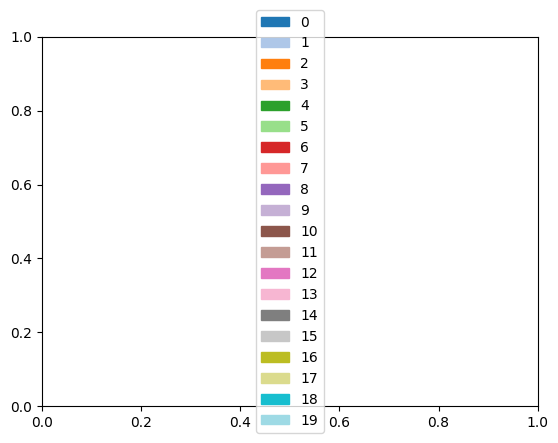

In [127]:
vis_utils.display_legend(np.unique(volume), vis_utils.get_cmap(len(np.unique(volume))))
plt.savefig('/data/estorrs/sandbox/subclone_ht397b1_visium_nbhds_legend.svg', dpi=300)

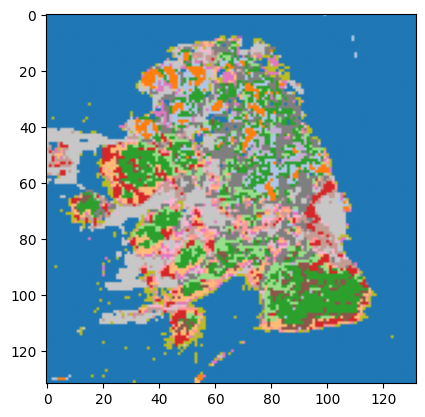

In [128]:
rgb = vis_utils.display_labeled_as_rgb(volume[0])
plt.imshow(rgb)
plt.savefig('/data/estorrs/sandbox/subclone_ht397b1_visium_nbhds.svg', dpi=300)

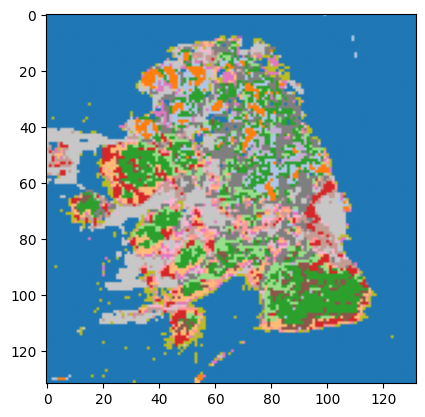

In [369]:
rgb = vis_utils.display_labeled_as_rgb(volume[0])
plt.imshow(rgb)
plt.savefig('/data/estorrs/sandbox/subclone_ht397b1_visium_nbhds.svg', dpi=300)

In [357]:
# !cat /data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml
!cat /data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/config.yaml

dtype_specific_params:
  he:
    trainer_kwargs:
      steps_per_epoch: 1000
  multiplex:
    trainer_kwargs:
      channel_mapping:
        AMACR: AMACR
        AMACR (D): AMACR
        AMACR (Dnew): AMACR
        AMACR (d): AMACR
        AMACR(D): AMACR
        AMACR(Dnew): AMACR
        AMACR(d): AMACR
        AMACR-(D): AMACR
        AMACR-(Dnew): AMACR
        AMACR-(d): AMACR
        AQP1: AQP1
        AQP1 (D): AQP1
        AQP1 (Dnew): AQP1
        AQP1 (d): AQP1
        AQP1(D): AQP1
        AQP1(Dnew): AQP1
        AQP1(d): AQP1
        AQP1-(D): AQP1
        AQP1-(Dnew): AQP1
        AQP1-(d): AQP1
        AQP2: AQP2
        AQP2 (D): AQP2
        AQP2 (Dnew): AQP2
        AQP2 (d): AQP2
        AQP2(D): AQP2
        AQP2(Dnew): AQP2
        AQP2(d): AQP2
        AQP2-(D): AQP2
        AQP2-(Dnew): AQP2
        AQP2-(d): AQP2
        AR: AR
        AR (D): AR
        AR (Dnew): AR
        AR (d): AR
        AR(D): AR
        AR(Dnew): AR
        AR(d): AR
        AR-(D): AR


In [129]:
config = yaml.safe_load(open('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml'))
sid_to_adata = {
    ('HT397B1-U1', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT397B1/s0_visium_processed.h5ad'),
    ('HT397B1-U21', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT397B1/s3_visium_processed.h5ad'),
}

In [130]:
for (sid, dtype), a in sid_to_adata.items():
    pts = a.obsm['spatial']
    labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=-1, volume=volume, use_volume=True)
    a.obs['nbhd'] = [f'nbhd {l}' for l in labels]
    a.obs['annotation'] = [sub if 'clone' in sub else nbhd
                           for sub, nbhd in zip(a.obs['subclone'], a.obs['nbhd'])]


In [131]:
# harmonize

In [132]:
a.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT397B1-U21_AAACAGAGCGACTCCT-1,1,14,94,3.0,402.0,3.0,402.0,3.0,402.0,1.0,...,NaN,1.0,TME,AAACAGAGCGACTCCT-1,HT397B1-S1H3A1U21Bp1,0.739682,HT397B1-U21,clone_3,nbhd 10,clone_3
HT397B1-U21_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGCTTTCAGAAG-1,HT397B1-S1H3A1U21Bp1,0.756815,HT397B1-U21,,nbhd 10,nbhd 10
HT397B1-U21_AAACAGTGTTCCTGGG-1,1,73,43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGTGTTCCTGGG-1,HT397B1-S1H3A1U21Bp1,0.747549,HT397B1-U21,,nbhd 16,nbhd 16
HT397B1-U21_AAACCGGGTAGGTACC-1,1,42,28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACCGGGTAGGTACC-1,HT397B1-S1H3A1U21Bp1,0.770992,HT397B1-U21,,nbhd 13,nbhd 13
HT397B1-U21_AAACCGTTCGTCCAGG-1,1,52,42,2.0,232.0,2.0,232.0,2.0,232.0,2.0,...,NaN,2.0,TME,AAACCGTTCGTCCAGG-1,HT397B1-S1H3A1U21Bp1,0.871284,HT397B1-U21,clone_3,nbhd 3,clone_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-U21_TTGTTCAGTGTGCTAC-1,1,24,64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTCAGTGTGCTAC-1,HT397B1-S1H3A1U21Bp1,0.745518,HT397B1-U21,,nbhd 10,nbhd 10
HT397B1-U21_TTGTTGTGTGTCAAGA-1,1,31,77,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTGTGTGTCAAGA-1,HT397B1-S1H3A1U21Bp1,0.629916,HT397B1-U21,,nbhd 7,nbhd 7
HT397B1-U21_TTGTTTCACATCCAGG-1,1,58,42,1.0,232.0,1.0,232.0,1.0,232.0,2.0,...,Tumor boundary,2.0,TME,TTGTTTCACATCCAGG-1,HT397B1-S1H3A1U21Bp1,0.852332,HT397B1-U21,clone_3,nbhd 3,clone_3
HT397B1-U21_TTGTTTCATTAGTCTA-1,1,60,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCATTAGTCTA-1,HT397B1-S1H3A1U21Bp1,0.743960,HT397B1-U21,,nbhd 7,nbhd 7


... storing 'nbhd' as categorical
... storing 'annotation' as categorical


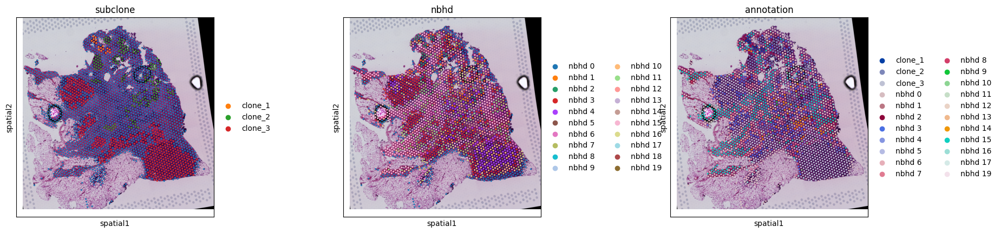

In [133]:
sc.pl.spatial(a, color=['subclone', 'nbhd', 'annotation'])

In [134]:
import anndata
combined = anndata.concat(sid_to_adata.values())
combined.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT397B1-U1_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT397B1-S1H3A1U1Bp1,0.732950,HT397B1-U1,,nbhd 4,nbhd 4
HT397B1-U1_AAACACCAATAACTGC-1,1,59,19,1.0,232.0,1.0,232.0,1.0,232.0,33.0,...,Tumor boundary,33.0,Tumor,AAACACCAATAACTGC-1,HT397B1-S1H3A1U1Bp1,0.905124,HT397B1-U1,clone_2,nbhd 15,clone_2
HT397B1-U1_AAACAGAGCGACTCCT-1,1,14,94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGAGCGACTCCT-1,HT397B1-S1H3A1U1Bp1,0.759410,HT397B1-U1,,nbhd 4,nbhd 4
HT397B1-U1_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGCTTTCAGAAG-1,HT397B1-S1H3A1U1Bp1,0.716851,HT397B1-U1,,nbhd 7,nbhd 7
HT397B1-U1_AAACAGGGTCTATATT-1,1,47,13,1.0,232.0,0.0,0.0,unknown,0.0,1.0,...,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT397B1-S1H3A1U1Bp1,0.939888,HT397B1-U1,clone_1,nbhd 2,clone_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-U21_TTGTTCAGTGTGCTAC-1,1,24,64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTCAGTGTGCTAC-1,HT397B1-S1H3A1U21Bp1,0.745518,HT397B1-U21,,nbhd 10,nbhd 10
HT397B1-U21_TTGTTGTGTGTCAAGA-1,1,31,77,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTGTGTGTCAAGA-1,HT397B1-S1H3A1U21Bp1,0.629916,HT397B1-U21,,nbhd 7,nbhd 7
HT397B1-U21_TTGTTTCACATCCAGG-1,1,58,42,1.0,232.0,1.0,232.0,1.0,232.0,2.0,...,Tumor boundary,2.0,TME,TTGTTTCACATCCAGG-1,HT397B1-S1H3A1U21Bp1,0.852332,HT397B1-U21,clone_3,nbhd 3,clone_3
HT397B1-U21_TTGTTTCATTAGTCTA-1,1,60,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCATTAGTCTA-1,HT397B1-S1H3A1U21Bp1,0.743960,HT397B1-U21,,nbhd 7,nbhd 7


In [135]:
exclude = [nbhd for nbhd, val in Counter(combined.obs['nbhd']).items() if val <= 10]

counts = Counter([nbhd for clone, nbhd in zip(combined.obs['subclone'], combined.obs['nbhd']) if clone!=''])
total_counts = Counter(combined.obs['nbhd'])

for k, v in counts.items():
    frac = v / total_counts[k]
    print(k, frac)
    if frac > .5:
        exclude.append(k)
    
exclude.append('nbhd 0') # background

combined = combined[np.asarray([True if x not in exclude else False for x in combined.obs['nbhd']])]
combined

nbhd 15 0.097708082026538
nbhd 2 0.5072463768115942
nbhd 1 0.4262295081967213
nbhd 3 0.4152046783625731
nbhd 4 0.518361581920904
nbhd 5 0.32142857142857145
nbhd 14 0.2040358744394619
nbhd 10 0.6375545851528385
nbhd 13 0.22085889570552147
nbhd 16 0.17894736842105263
nbhd 12 0.2535211267605634
nbhd 9 0.3103448275862069
nbhd 7 0.19333333333333333
nbhd 0 0.1308980213089802
nbhd 6 0.23636363636363636
nbhd 11 0.10931174089068826
nbhd 8 0.3333333333333333
nbhd 18 1.0


View of AnnData object with n_obs × n_vars = 3758 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial'

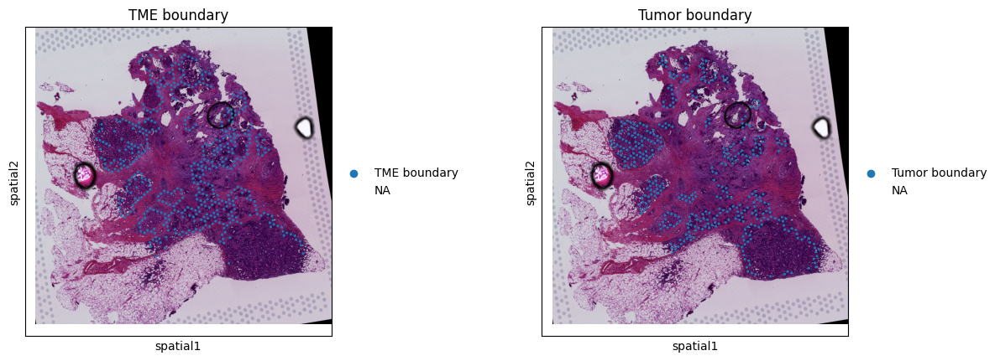

In [530]:
sc.pl.spatial(a, color=['TME boundary', 'Tumor boundary'])

In [531]:
boundary = combined[pd.isnull(combined.obs[['TME boundary', 'Tumor boundary']]).sum(1) < 2]
boundary

View of AnnData object with n_obs × n_vars = 1345 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial'

In [536]:
bb = boundary[boundary.obs['Tumor boundary']=='Tumor boundary']
bb

View of AnnData object with n_obs × n_vars = 607 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial'

In [608]:
from collections import Counter

clone_to_counts = {}
data = []
order = [k for k in sorted(set(bb.obs['nbhd'])) if k not in exclude]
clones = [c for c in sorted(set(bb.obs['subclone'])) if c]
total_counts = Counter(bb.obs['nbhd'])
for clone in clones:
    mask = bb.obs['subclone']==clone
    n = np.count_nonzero(mask)
    cs = Counter(bb.obs[mask]['nbhd'])
    d = {k:cs[k] / total_counts[k] for k in order}
    data.append([d.get(k, 0) for k in order])
df = pd.DataFrame(data, index=clones, columns=order).T
df.sort_values('clone_3', ascending=False)

,clone_1,clone_2,clone_3
nbhd 6,0.022727,0.090909,0.886364
nbhd 3,0.000000,0.145833,0.854167
nbhd 7,0.051282,0.179487,0.769231
nbhd 11,0.000000,0.333333,0.666667
nbhd 16,0.142857,0.190476,0.666667
nbhd 13,0.000000,0.387097,0.612903
nbhd 5,0.046154,0.353846,0.600000
nbhd 15,0.104478,0.477612,0.417910
nbhd 12,0.151515,0.484848,0.363636
nbhd 14,0.081081,0.675676,0.243243


In [612]:
source = df.copy()
source['nbhd'] = source.index.to_list()
source = source.melt(id_vars=['nbhd'])
source

,nbhd,variable,value
0,nbhd 1,clone_1,0.173077
1,nbhd 11,clone_1,0.000000
2,nbhd 12,clone_1,0.151515
3,nbhd 13,clone_1,0.000000
4,nbhd 14,clone_1,0.081081
5,nbhd 15,clone_1,0.104478
6,nbhd 16,clone_1,0.142857
7,nbhd 3,clone_1,0.000000
8,nbhd 5,clone_1,0.046154
9,nbhd 6,clone_1,0.022727


In [620]:
import altair as alt
nbhd_order = df.sort_values('clone_3', ascending=False).index.to_list()
alt.Chart(source).mark_bar().encode(
    x='sum(value)',
    y=alt.Y('nbhd', sort=nbhd_order),
    color='variable'
)

alt.Chart(...)

In [47]:
def get_nbhd_rgb(labeled, nbhds, cmap=None):
    rgb = vis_utils.display_labeled_as_rgb(labeled, cmap=cmap)
    
    m = np.zeros_like(labeled, dtype=bool)
    for l in nbhds:
        m |= labeled==l
    
    rgb[~m] = 0.
    
    return rgb

def get_intensity_img(case, dtype, gene):
    dtype_to_true_pixels = pickle.load(
        open(os.path.join(project_dir, case, 'mushroom_50res', 'true_pixels.pkl'), 'rb')
    )
    
    channels, true_pixels = dtype_to_true_pixels[dtype]['channels'], dtype_to_true_pixels[dtype]['true_pixels']
    true_pixels = true_pixels[0]
    
    img = true_pixels[..., channels.index(gene)]
    
    return img


In [544]:
df.sort_values('clone_3', ascending=False)

,clone_1,clone_2,clone_3
nbhd 6,0.022727,0.090909,0.886364
nbhd 3,0.000000,0.145833,0.854167
nbhd 7,0.051282,0.179487,0.769231
nbhd 11,0.000000,0.333333,0.666667
nbhd 16,0.142857,0.190476,0.666667
nbhd 13,0.000000,0.387097,0.612903
nbhd 5,0.046154,0.353846,0.600000
nbhd 15,0.104478,0.477612,0.417910
nbhd 12,0.151515,0.484848,0.363636
nbhd 14,0.081081,0.675676,0.243243


In [545]:
n = df.shape[0] // 4 # quartiles
idc_group = df.sort_values('clone_3', ascending=False).index[:n].to_list()
dcis_group = df.sort_values('clone_3', ascending=False).index[-n:].to_list()
order = idc_group + dcis_group[::-1]
idc_group, dcis_group

(['nbhd 6', 'nbhd 3', 'nbhd 7'], ['nbhd 14', 'nbhd 9', 'nbhd 1'])

In [598]:
mapping = {
    6: (121, 171, 73),
    3: (36, 84, 181),
    7: (28, 135, 101),
    1: (143, 69, 196),
    9: (189, 40, 127),
    14: (201, 90, 42),
}
mapping.keys()

dict_keys([6, 3, 7, 1, 9, 14])

In [596]:
cmap = sns.color_palette('tab20')
for i in range(len(cmap)):
    if i in mapping:
        cmap[i] = np.asarray(mapping[i]) / 255.
cmap

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 array([0.56078431, 0.27058824, 0.76862745]),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 array([0.14117647, 0.32941176, 0.70980392]),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 array([0.4745098 , 0.67058824, 0.28627451]),
 array([0.10980392, 0.52941176, 0.39607843]),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 array([0.74117647, 0.15686275, 0.49803922]),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 array([0.78823529, 0.35294118, 0.16470588]),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

(-0.5, 131.5, 131.5, -0.5)

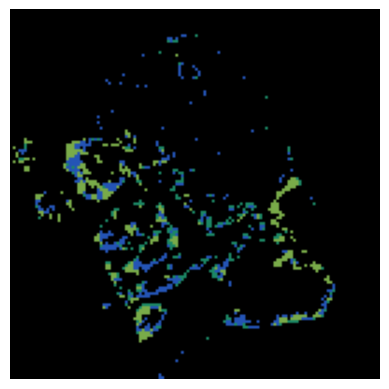

In [605]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in idc_group], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

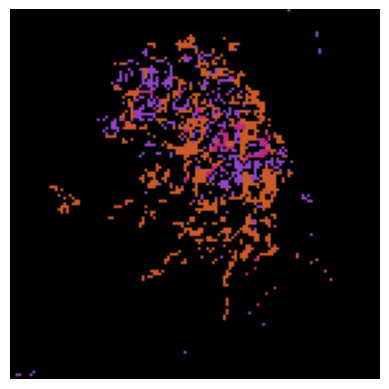

In [606]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in dcis_group], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

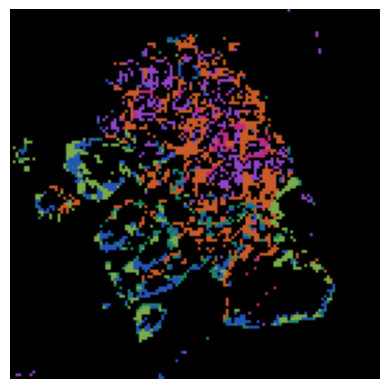

In [607]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in order], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

In [136]:
fps = sorted(utils.listfiles('/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U12.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U2.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U22.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U31.txt']

In [137]:
for fp in fps:
    df = pd.read_csv(fp, sep='\t')
    labels = set(df['cell_type'])
    print(fp, labels)

/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U12.txt {'Immune', 'Fibroblast', 'Epithelial', 'Unlabeled', 'Endothelial'}
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U2.txt {'Immune', 'Fibroblast', 'Epithelial', 'Unlabeled', 'Endothelial'}
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U22.txt {'Dendritic', 'Immune', 'Fibroblast', 'T cell', 'Epithelial', 'Unlabeled', 'Treg', 'CD8 T cell', 'Endothelial'}
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U31.txt {'Immune', 'Fibroblast', 'T cell', 'Epithelial', 'Unlabeled', 'Treg', 'CD8 T cell', 'Endothelial'}


In [138]:
case_to_feat_df = {}
for fp in fps:
    case = fp.split('/')[-1].replace('.txt', '')
    df = pd.read_csv(fp, sep='\t')
    df['case'] = case
    df = df[['row', 'col', 'case', 'cell_type']]

    labels = set(df['cell_type'])
    if 'T cell' in labels: # make sure we only do the t cell ones
        case_to_feat_df[case] = df
case_to_feat_df.keys()

dict_keys(['HT397B1-U22', 'HT397B1-U31'])

In [139]:
for case, df in case_to_feat_df.items():
    pts = df[['col', 'row']].values
    labels = mushroom.assign_pts(pts, (case, 'multiplex'), 'integrated', use_volume=True, volume=volume)
    df['nbhd'] = [f'nbhd {x}' for x in labels]
next(iter(case_to_feat_df.values()))

,row,col,case,cell_type,nbhd
0,116,4495,HT397B1-U22,Unlabeled,nbhd 0
1,148,4061,HT397B1-U22,Unlabeled,nbhd 0
2,133,4286,HT397B1-U22,Unlabeled,nbhd 0
3,748,8711,HT397B1-U22,Unlabeled,nbhd 0
4,865,6667,HT397B1-U22,Unlabeled,nbhd 0
...,...,...,...,...,...
154091,18620,7012,HT397B1-U22,Epithelial,nbhd 16
154092,18619,7061,HT397B1-U22,Epithelial,nbhd 16
154093,18632,7025,HT397B1-U22,Epithelial,nbhd 16
154094,17989,14840,HT397B1-U22,Unlabeled,nbhd 0


(-901.7, 18935.7, 19565.15, -810.1500000000001)

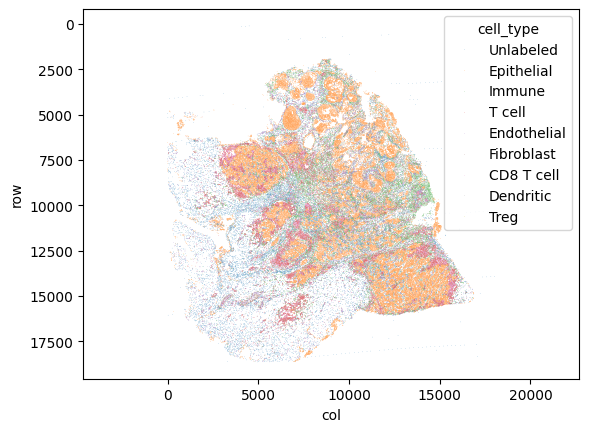

In [140]:
sns.scatterplot(case_to_feat_df['HT397B1-U22'], x='col', y='row', hue='cell_type', s=.1)
plt.gca().invert_yaxis()
plt.axis('equal')

In [141]:
show = ['CD8 T cell', 'T cell', 'Treg', 'Fibroblast']

In [142]:
df = pd.concat(case_to_feat_df.values(), axis=0)

nbhds = sorted(set(df['nbhd']))
cts = sorted(set(df['cell_type']))
data = []
for nbhd in nbhds:
    f = df[df['nbhd']==nbhd]
    counts = Counter(f['cell_type'])
    data.append([counts.get(ct, 0) for ct in cts])
count_df = pd.DataFrame(data=data, columns=cts, index=nbhds)
count_df

,CD8 T cell,Dendritic,Endothelial,Epithelial,Fibroblast,Immune,T cell,Treg,Unlabeled
nbhd 0,1771,42,5215,12880,2375,4328,7453,37,17232
nbhd 1,701,8,836,7126,933,1576,1981,36,885
nbhd 10,1623,22,1149,5915,774,3052,4838,57,1687
nbhd 11,200,1,498,860,207,582,984,7,1462
nbhd 12,1335,10,939,13253,509,1915,3843,43,1066
nbhd 13,750,14,963,3777,528,2115,2864,34,1972
nbhd 14,729,11,1082,5470,1607,2918,2587,31,1626
nbhd 15,1432,34,2401,6542,1966,5837,5594,64,5381
nbhd 16,1146,8,1293,6684,1584,2600,3653,36,2605
nbhd 2,62,0,172,2040,227,271,207,5,168


In [143]:
count_df.loc[order]

IndexingError: Too many indexers

In [145]:
frac_df = count_df / np.expand_dims(count_df.values.sum(1), -1)
# frac_df.loc[order, show]

In [147]:
frac_df = count_df / np.expand_dims(count_df.values.sum(1), -1)
# frac_df.loc[order,]

In [ ]:
frac_df.loc[nbhd_order, ['CD8 T cell', 'T cell', 'Fibroblast']] # t cell and fibroblast only

In [629]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

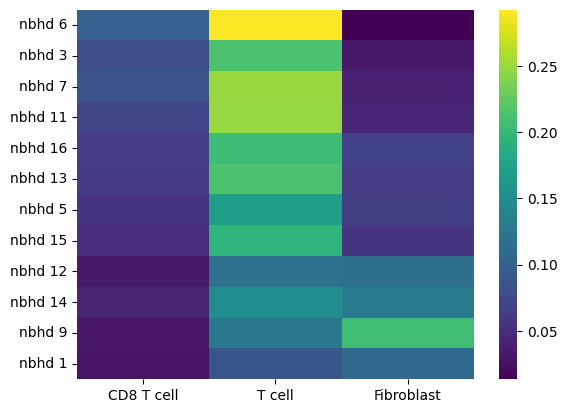

In [630]:
sns.heatmap(
    frac_df.loc[nbhd_order, ['CD8 T cell', 'T cell', 'Fibroblast']], cmap='viridis'
)
plt.savefig('/data/estorrs/sandbox/subclone_ht397B1_ct_fractions.svg')

In [154]:
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U12.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U2.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U22.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U31.txt']

In [151]:
set(df['case'])

{'HT397B1-U22', 'HT397B1-U31'}

In [161]:
case_to_feat_df = {}
for fp in fps:
    case = fp.split('/')[-1].replace('.txt', '')
    df = pd.read_csv(fp, sep='\t')
    df['case'] = case
    df = df[['row', 'col', 'case', 'cell_type']]

    labels = set(df['cell_type'])
#     if 'T cell' in labels: # make sure we only do the t cell ones
    case_to_feat_df[case] = df
case_to_feat_df.keys()

dict_keys(['HT397B1-U12', 'HT397B1-U2', 'HT397B1-U22', 'HT397B1-U31'])

In [162]:
for case, df in case_to_feat_df.items():
    pts = df[['col', 'row']].values
    labels = mushroom.assign_pts(pts, (case, 'multiplex'), 'integrated', use_volume=True, volume=volume)
    df['nbhd'] = [f'nbhd {x}' for x in labels]
next(iter(case_to_feat_df.values()))

,row,col,case,cell_type,nbhd
0,285,6248,HT397B1-U12,Unlabeled,nbhd 0
1,475,4878,HT397B1-U12,Unlabeled,nbhd 0
2,501,4883,HT397B1-U12,Unlabeled,nbhd 0
3,1089,11507,HT397B1-U12,Epithelial,nbhd 0
4,1339,11047,HT397B1-U12,Unlabeled,nbhd 0
...,...,...,...,...,...
180836,18614,3494,HT397B1-U12,Endothelial,nbhd 0
180837,18627,3889,HT397B1-U12,Endothelial,nbhd 0
180838,18629,3855,HT397B1-U12,Endothelial,nbhd 0
180839,18619,3440,HT397B1-U12,Unlabeled,nbhd 0


In [163]:
df = pd.concat(case_to_feat_df.values(), axis=0)

In [164]:
set(df['cell_type']), set(df['case'])

({'CD8 T cell',
  'Dendritic',
  'Endothelial',
  'Epithelial',
  'Fibroblast',
  'Immune',
  'T cell',
  'Treg',
  'Unlabeled'},
 {'HT397B1-U12', 'HT397B1-U2', 'HT397B1-U22', 'HT397B1-U31'})

In [165]:
mapping = {
    'Immune': ['CD8 T cell', 'Dendritic', 'Immune', 'T cell', 'Treg'],
    'Endothelial': ['Endothelial'],
    'Epithelial': ['Epithelial'],
    'Unlabeled': ['Unlabeled'],
    'Fibroblast': ['Fibroblast'],
}
r_mapping = {v:k for k, vs in mapping.items() for v in vs}
df['cell_type'] = [r_mapping[x] for x in df['cell_type']]
df

,row,col,case,cell_type,nbhd
0,285,6248,HT397B1-U12,Unlabeled,nbhd 0
1,475,4878,HT397B1-U12,Unlabeled,nbhd 0
2,501,4883,HT397B1-U12,Unlabeled,nbhd 0
3,1089,11507,HT397B1-U12,Epithelial,nbhd 0
4,1339,11047,HT397B1-U12,Unlabeled,nbhd 0
...,...,...,...,...,...
117082,18635,6218,HT397B1-U31,Unlabeled,nbhd 0
117083,18639,6488,HT397B1-U31,Unlabeled,nbhd 0
117084,18338,15154,HT397B1-U31,Unlabeled,nbhd 0
117085,18321,15430,HT397B1-U31,Unlabeled,nbhd 0


In [166]:
nbhds = sorted(set(df['nbhd']))
cts = sorted(set(df['cell_type']))
data = []
for nbhd in nbhds:
    f = df[df['nbhd']==nbhd]
    counts = Counter(f['cell_type'])
    data.append([counts.get(ct, 0) for ct in cts])
count_df = pd.DataFrame(data=data, columns=cts, index=nbhds)
count_df

,Endothelial,Epithelial,Fibroblast,Immune,Unlabeled
nbhd 0,13265,26772,4199,24503,26446
nbhd 1,2241,24929,2466,8341,1746
nbhd 10,2853,12843,1727,16706,3111
nbhd 11,1703,3218,522,4866,4048
nbhd 12,2464,24465,1250,12817,2100
nbhd 13,2677,9476,1091,11032,2976
nbhd 14,3857,18598,4346,16663,3598
nbhd 15,7545,21140,5178,31390,9394
nbhd 16,3549,15850,2618,13490,4205
nbhd 2,866,10479,723,1393,472


In [167]:
frac_df = count_df / np.expand_dims(count_df.values.sum(1), -1)
frac_df

,Endothelial,Epithelial,Fibroblast,Immune,Unlabeled
nbhd 0,0.139360,0.281263,0.044114,0.257425,0.277838
nbhd 1,0.056416,0.627571,0.062080,0.209979,0.043954
nbhd 10,0.076611,0.344871,0.046375,0.448604,0.083539
nbhd 11,0.118618,0.224142,0.036359,0.338929,0.281953
nbhd 12,0.057175,0.567686,0.029005,0.297406,0.048728
nbhd 13,0.098231,0.347718,0.040034,0.404814,0.109203
nbhd 14,0.081956,0.395181,0.092346,0.354065,0.076452
nbhd 15,0.101076,0.283200,0.069366,0.420513,0.125846
nbhd 16,0.089368,0.399124,0.065925,0.339696,0.105887
nbhd 2,0.062155,0.752099,0.051891,0.099978,0.033876


In [168]:
frac_df[frac_df['Epithelial']>.6]

,Endothelial,Epithelial,Fibroblast,Immune,Unlabeled
nbhd 1,0.056416,0.627571,0.062080,0.209979,0.043954
nbhd 2,0.062155,0.752099,0.051891,0.099978,0.033876
nbhd 4,0.048965,0.712995,0.045088,0.159882,0.033070


In [189]:
tumor_nbhds = frac_df[frac_df['Epithelial']>.60].index.to_list()
tumor_nbhds

['nbhd 1', 'nbhd 2', 'nbhd 4']

(-0.5, 131.5, 131.5, -0.5)

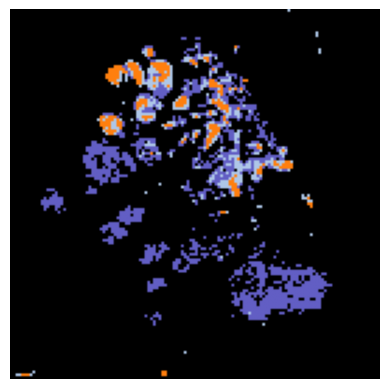

In [190]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in tumor_nbhds], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

In [191]:
df

,row,col,case,cell_type,nbhd
0,285,6248,HT397B1-U12,Unlabeled,nbhd 0
1,475,4878,HT397B1-U12,Unlabeled,nbhd 0
2,501,4883,HT397B1-U12,Unlabeled,nbhd 0
3,1089,11507,HT397B1-U12,Epithelial,nbhd 0
4,1339,11047,HT397B1-U12,Unlabeled,nbhd 0
...,...,...,...,...,...
117082,18635,6218,HT397B1-U31,Unlabeled,nbhd 0
117083,18639,6488,HT397B1-U31,Unlabeled,nbhd 0
117084,18338,15154,HT397B1-U31,Unlabeled,nbhd 0
117085,18321,15430,HT397B1-U31,Unlabeled,nbhd 0


In [192]:
tiling_size = int(mushroom.trainer_kwargs['target_resolution'] / mushroom.trainer_kwargs['input_resolution'])
tiling_size

137

In [193]:
cell_types = sorted(set(df['cell_type'].to_list()))
cell_types

['Endothelial', 'Epithelial', 'Fibroblast', 'Immune', 'Unlabeled']

In [194]:
hots = np.asarray([[1. if ct == x else 0. for ct in cell_types]
                    for x in df['cell_type']])
hots

array([[0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       ...,
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.],
       [0., 0., 0., 0., 1.]])

In [195]:
import anndata

In [200]:
df[['row', 'col']].values

array([[  285,  6248],
       [  475,  4878],
       [  501,  4883],
       ...,
       [18338, 15154],
       [18321, 15430],
       [18251, 16337]])

In [251]:
fraction_adata = anndata.AnnData(X=hots, obs=df.copy())
fraction_adata.obsm['spatial'] = df[['col', 'row']].values
fraction_adata.var.index = cell_types
fraction_adata

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 654350 × 5
    obs: 'row', 'col', 'case', 'cell_type', 'nbhd'
    obsm: 'spatial'

In [252]:
import mushroom.data.visium as visium

In [253]:
a = next(iter(mushroom.dtype_to_spore['visium'].learner_data.dtype_to_section_to_adata['visium'].values()))
size = visium.get_fullres_size(a)
size

(18643, 18381)

In [254]:
def tile_img(adata, tiling_size, size):
    n_rows, n_cols = size[-2] // tiling_size + 1, size[-1] // tiling_size + 1

    pts = adata.obsm['spatial'][:, [1, 0]]

    img = np.zeros((n_rows, n_cols, adata.shape[1]))
    for r in range(n_rows):
        r1, r2 = r * tiling_size, (r + 1) * tiling_size
        row_mask = ((pts[:, 0] >= r1) & (pts[:, 0] < r2))
        row_adata, row_pts = adata[row_mask], pts[row_mask]
        for c in range(n_cols):
            c1, c2 = c * tiling_size, (c + 1) * tiling_size
            col_mask = ((row_pts[:, 1] >= c1) & (row_pts[:, 1] < c2))
            img[r, c] = row_adata[col_mask].X.sum(0)
    return img

In [255]:
img_objects = {}

In [256]:
fraction_adata.obs

,row,col,case,cell_type,nbhd
0,285,6248,HT397B1-U12,Unlabeled,nbhd 0
1,475,4878,HT397B1-U12,Unlabeled,nbhd 0
2,501,4883,HT397B1-U12,Unlabeled,nbhd 0
3,1089,11507,HT397B1-U12,Epithelial,nbhd 0
4,1339,11047,HT397B1-U12,Unlabeled,nbhd 0
...,...,...,...,...,...
117082,18635,6218,HT397B1-U31,Unlabeled,nbhd 0
117083,18639,6488,HT397B1-U31,Unlabeled,nbhd 0
117084,18338,15154,HT397B1-U31,Unlabeled,nbhd 0
117085,18321,15430,HT397B1-U31,Unlabeled,nbhd 0


In [257]:
sids = sorted(set(fraction_adata.obs['case']))
sid_to_img = {}

for sid in sids:
    a = fraction_adata[fraction_adata.obs['case']==sid]
    img = tile_img(a, tiling_size, size)
    
    # needs to be slightly scaled to match volume
    img = utils.rescale(img, size=(volume.shape[-2], volume.shape[-1]),
                        dim_order='h w c', target_dtype=img.dtype)
    sid_to_img[sid] = img

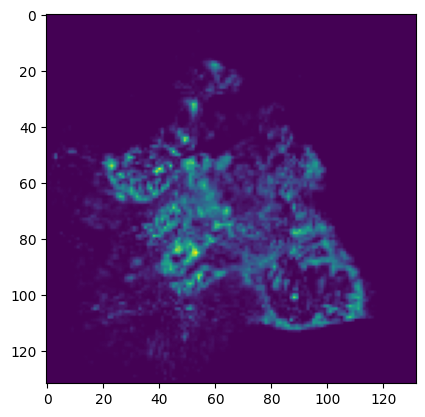

In [258]:
plt.imshow(img[..., 3])

In [259]:
spore = mushroom.dtype_to_spore['multiplex']

In [260]:
order, positions = zip(*[(sid, pos)
                         for (sid, dtype), pos in zip(mushroom.section_ids, mushroom.section_positions)
                         if (sid, dtype) in spore.section_ids])
order, positions

(('HT397B1-U2', 'HT397B1-U12', 'HT397B1-U22', 'HT397B1-U31'), (1, 11, 21, 30))

In [261]:
ct_volume = np.stack([sid_to_img[x] for x in order])
ct_volume.shape

(4, 132, 132, 5)

In [262]:
v = ct_volume.copy()
v = rearrange(v, 'n h w c -> c n h w')
v.shape

(5, 4, 132, 132)

In [263]:
positions = [0, *positions]
positions

[0, 1, 11, 21, 30]

In [264]:

v = np.concatenate((
    v[:, :1],
    v,
#     v[:, -1:],
), axis=1)
v.shape

(5, 5, 132, 132)

In [265]:

interpolated = utils.get_interpolated_volume(v, positions, method='linear')
interpolated.shape

(5, 31, 132, 132)

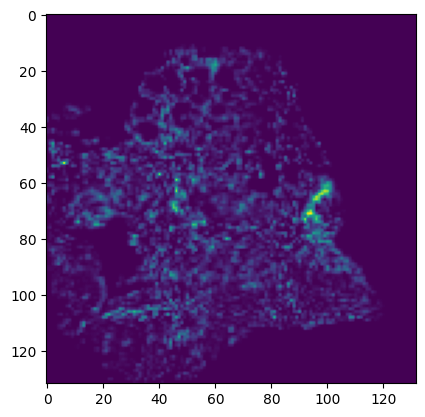

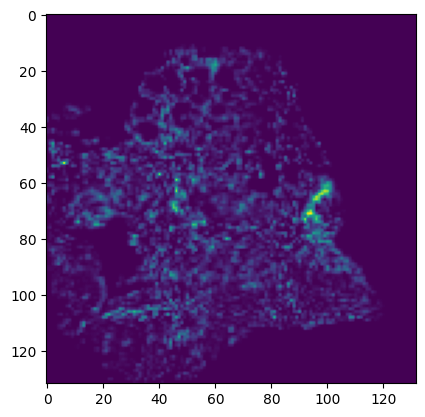

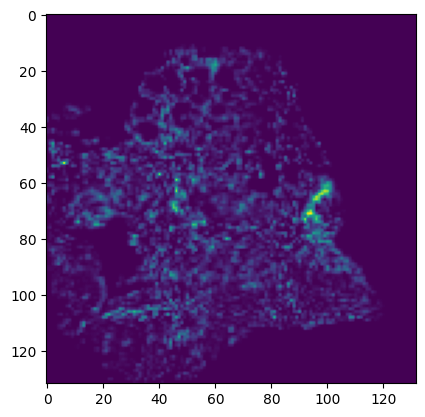

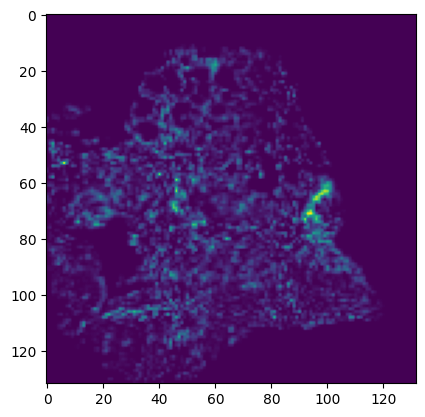

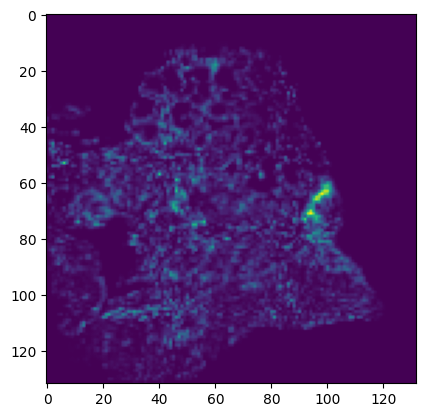

...

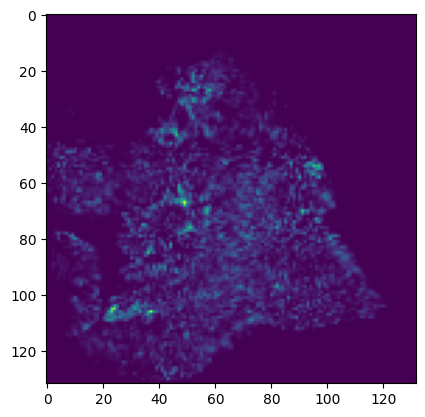

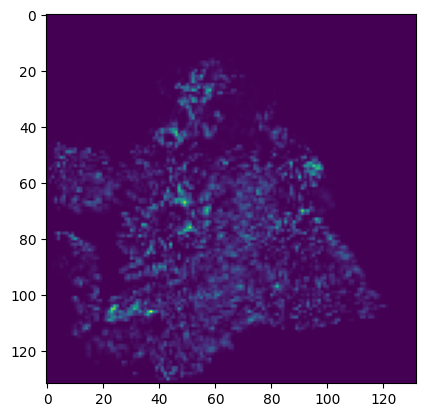

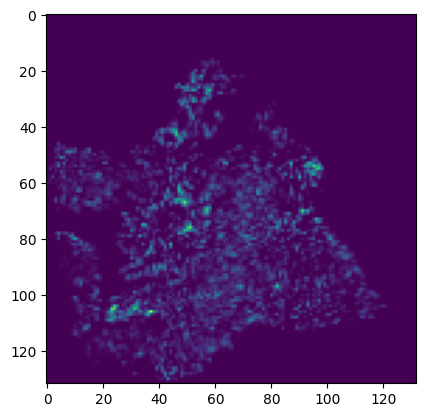

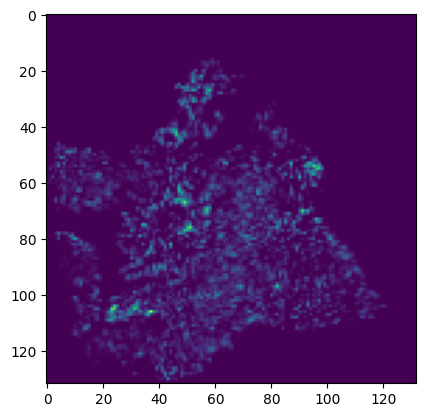

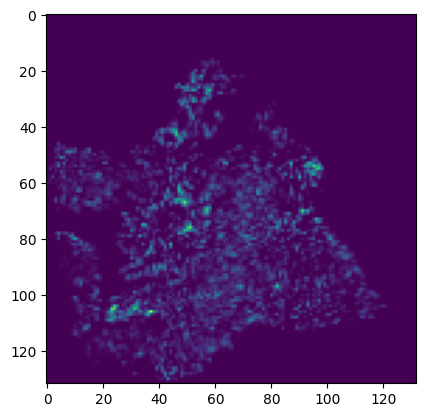

In [266]:
for x in rearrange(interpolated, 'c n h w -> n h w c'):
    plt.imshow(x[..., 0])
    plt.show()

In [267]:
out_dir = '/data/estorrs/mushroom/data/projects/subclone/HT397B1/volume_viz'
Path(out_dir).mkdir(parents=True, exist_ok=True)


In [268]:
x.shape

(132, 132, 5)

In [269]:
tifffile.imwrite(os.path.join(out_dir, 'ct_volume.tif'), interpolated)

In [270]:
# x = np.stack([sid_to_cytospace[sid] for sid in spore.section_ids])
# tifffile.imwrite(os.path.join(out_dir, 'cytospace_volume.tif'), x)

In [271]:
tifffile.imwrite(os.path.join(out_dir, 'nbhd_volume.tif'), volume)

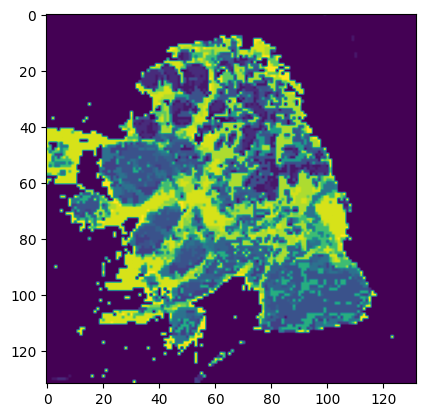

In [272]:
plt.imshow(volume[0])

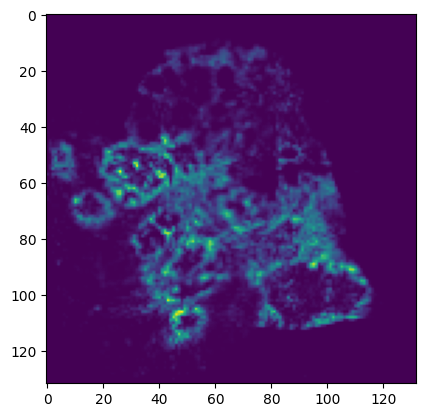

In [273]:
plt.imshow(interpolated[3, 0])

In [246]:
interpolated.shape

(5, 31, 132, 132)

In [274]:
cell_types

['Endothelial', 'Epithelial', 'Fibroblast', 'Immune', 'Unlabeled']

# HT268

In [10]:
case = 'HT268B1'

In [12]:
mushroom = Mushroom.from_config(
    os.path.join('/data/estorrs/mushroom/data/projects/subclone', case, f'mushroom_50res')
)

INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:4 sections detected: ['HT268B1-U2', 'HT268B1-U12', 'HT268B1-U22', 'HT268B1-U32']
INFO:root:processing sections
INFO:root:generating image data for section HT268B1-U2


0.007004457303449433


INFO:root:generating image data for section HT268B1-U12
INFO:root:generating image data for section HT268B1-U22
INFO:root:generating image data for section HT268B1-U32


he torch.Size([3, 135, 133])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT268B1-U2', 'he'), ('HT268B1-U12', 'he'), ('HT268B1-U22', 'he'), ('HT268B1-U32', 'he')]
INFO:root:creating data loaders
INFO:torch.distributed.nn.jit.instantiator:Created a temporary directory at /tmp/tmpp8z0_428
INFO:torch.distributed.nn.jit.instantiator:Writing /tmp/tmpp8z0_428/_remote_module_non_scriptable.py
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res/he_chkpts/last-v1.ckpt
INFO:root:loading spore for visium
INFO:root:data mask detected
INFO:root:starting visium processing
INFO:root:using 11051 channels
INFO:root:4 sections detected: ['HT268B1-U2', 'HT268B1-U12', 'HT268B1-U22', 'HT268B1-U32']
INFO:root:process

ppm 0.35022286517247164 target_ppm 100
tiling size 285


INFO:root:generating image data for section HT268B1-U2
INFO:root:generating image data for section HT268B1-U12
INFO:root:generating image data for section HT268B1-U22
INFO:root:generating image data for section HT268B1-U32


visium torch.Size([11051, 68, 68])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT268B1-U2', 'visium'), ('HT268B1-U12', 'visium'), ('HT268B1-U22', 'visium'), ('HT268B1-U32', 'visium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res/visium_chkpts/last-v1.ckpt
INFO:root:chkpt files detected, embedding to spores
INFO:root:embedding he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=6

Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding visium spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                       | 0/? [00:…

he 0


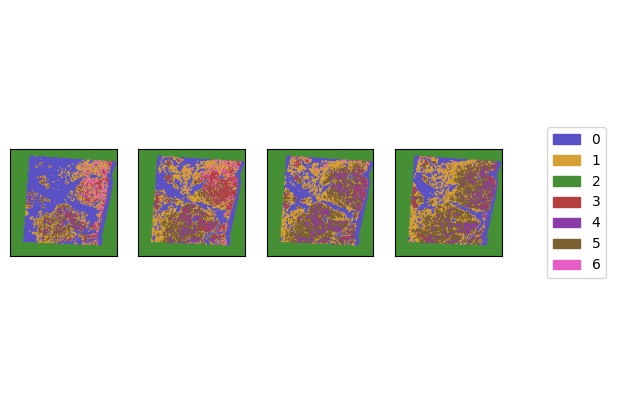

he 1


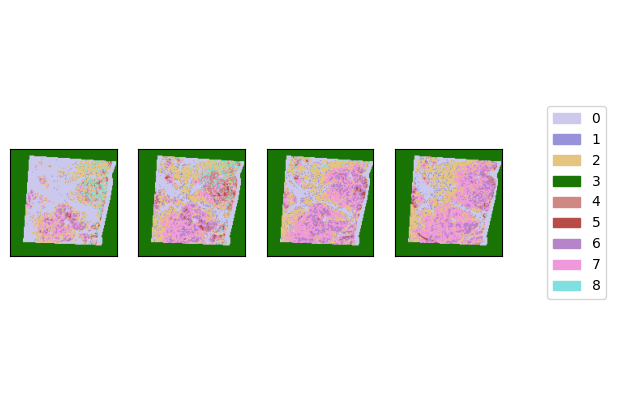

he 2


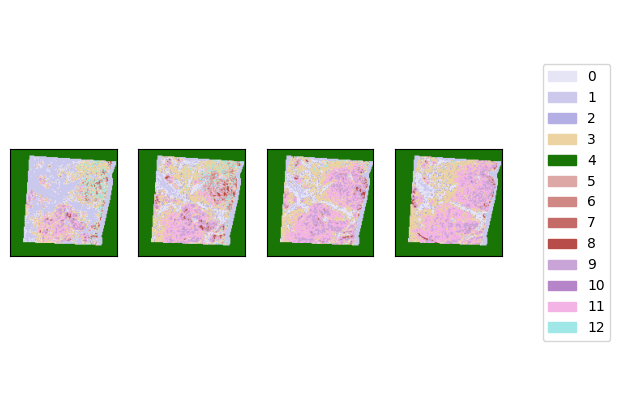

visium 0


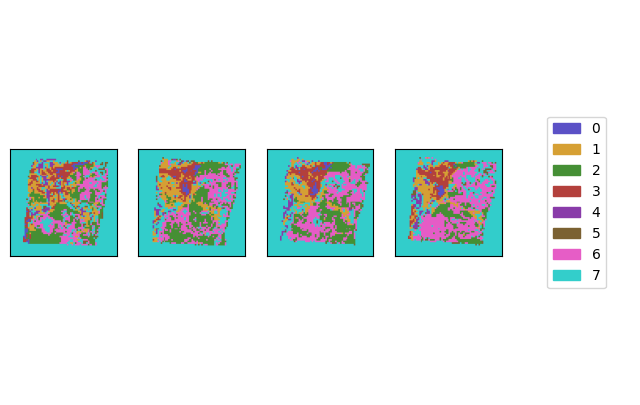

visium 1


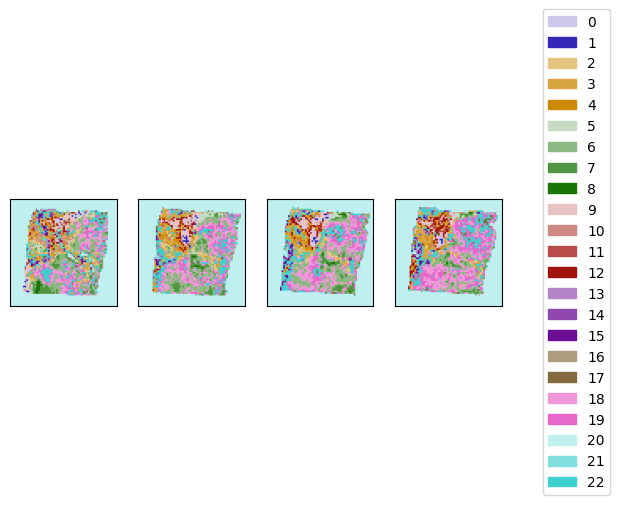

visium 2


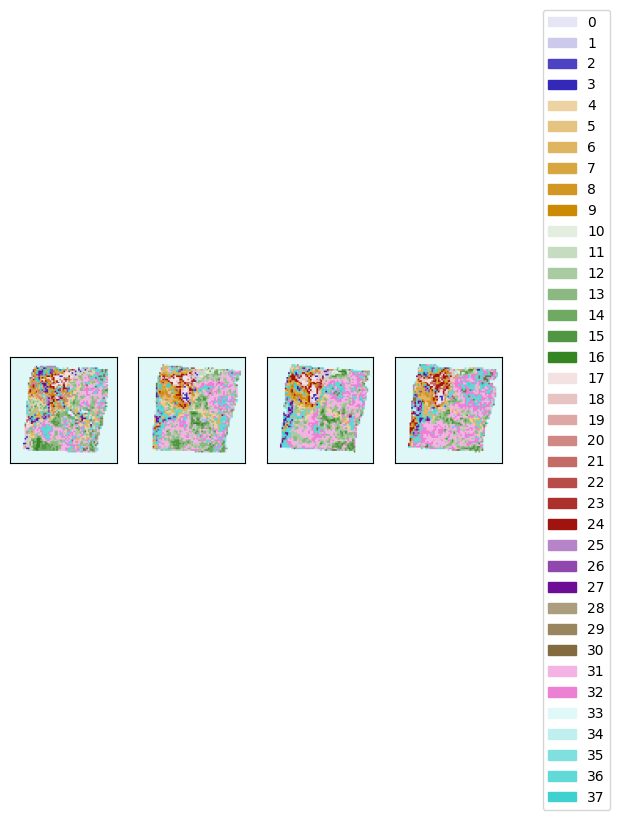

In [13]:
for dtype in mushroom.dtypes:
    for level in range(mushroom.num_levels):
        print(dtype, level)
        mushroom.display_clusters(dtype, level=level)
        plt.show()

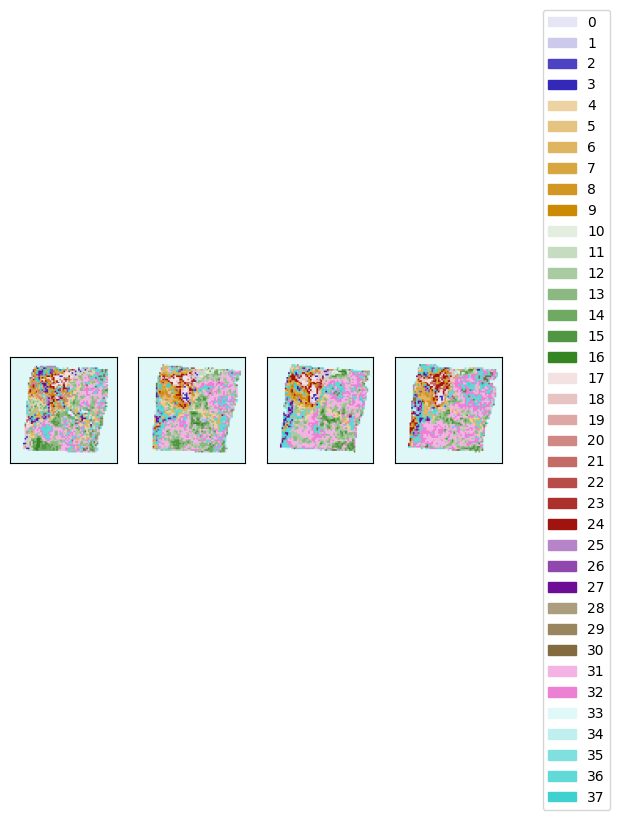

In [14]:
mushroom.display_clusters('visium', level=2)
plt.savefig('/data/estorrs/sandbox/subclone_ht268b1_visium_nbhds.svg', dpi=300)

In [15]:
volume = pickle.load(
    open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']['visium']
dtype_to_volume = pickle.load(
    open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']

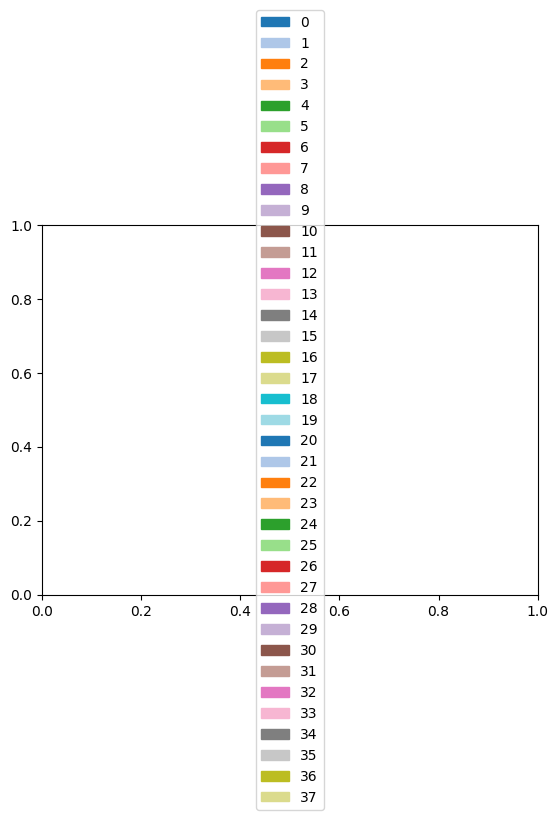

In [16]:
vis_utils.display_legend(np.unique(volume), vis_utils.get_cmap(len(np.unique(volume))))

In [17]:
mushroom.section_ids

[('HT268B1-U2', 'visium'),
 ('HT268B1-U2', 'he'),
 ('HT268B1-U12', 'visium'),
 ('HT268B1-U12', 'he'),
 ('HT268B1-U22', 'visium'),
 ('HT268B1-U22', 'he'),
 ('HT268B1-U32', 'visium'),
 ('HT268B1-U32', 'he')]

In [18]:
# # !cat /data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml
!cat /data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1/config.yaml

- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s0_visium_processed.h5ad
  id: s0
  position: 0
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s1_visium_processed.h5ad
  id: s1
  position: 200
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s2_visium_processed.h5ad
  id: s2
  position: 300
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s3_visium_processed.h5ad
  id: s3
  position: 400
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s4_visium_processed.h5ad
  id: s4
  position: 500


In [19]:
config = yaml.safe_load(open('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1/config.yaml'))
sid_to_adata = {
    ('HT268B1-U2', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s1_visium_processed.h5ad'),
    ('HT268B1-U12', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s2_visium_processed.h5ad'),
    ('HT268B1-U22', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s3_visium_processed.h5ad'),
    ('HT268B1-U32', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s4_visium_processed.h5ad'),
}

In [20]:
for (sid, dtype), a in sid_to_adata.items():
    pts = a.obsm['spatial']
    labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=-1, volume=volume, use_volume=True)
    a.obs['nbhd'] = [f'nbhd {l}' for l in labels]
    a.obs['annotation'] = [sub if 'clone' in sub else nbhd
                           for sub, nbhd in zip(a.obs['subclone'], a.obs['nbhd'])]


In [21]:
# harmonize
list(a.obs.columns)

['in_tissue',
 'array_row',
 'array_col',
 'FC1',
 'FC2',
 'FC3',
 'FC4',
 'FC5',
 'FC6',
 'Filtered tumor regions',
 'Filtered tumor regions auto',
 'Filtered tumor vs. TME',
 'Manual annotation',
 'Morphologically processed purity',
 'Purity',
 'TME before boundary',
 'TME boundary',
 'Tumor before boundary',
 'Tumor boundary',
 'Tumor regions',
 'Tumor vs. TME',
 'barcode',
 'library_id',
 'original',
 'sample_id',
 'subclone',
 'nbhd',
 'annotation']

In [22]:
a.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT268B1-U32_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.714296,HT268B1-U32,,nbhd 21,nbhd 21
HT268B1-U32_AAACACCAATAACTGC-1,1,59,19,3.0,466.0,3.0,466.0,3.0,466.0,1.0,...,NaN,1.0,Tumor,AAACACCAATAACTGC-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.866085,HT268B1-U32,clone_2,nbhd 12,clone_2
HT268B1-U32_AAACAGAGCGACTCCT-1,1,14,94,4.0,617.0,4.0,617.0,4.0,617.0,2.0,...,NaN,2.0,Tumor,AAACAGAGCGACTCCT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.873439,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_AAACAGCTTTCAGAAG-1,1,43,9,4.0,614.0,4.0,614.0,4.0,614.0,1.0,...,NaN,1.0,Tumor,AAACAGCTTTCAGAAG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.887271,HT268B1-U32,clone_2,nbhd 32,clone_2
HT268B1-U32_AAACAGGGTCTATATT-1,1,47,13,7.0,1393.0,8.0,1453.0,unknown,0.0,1.0,...,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.872409,HT268B1-U32,clone_2,nbhd 13,clone_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,NaN,2.0,Tumor,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,,nbhd 12,nbhd 12
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,NaN,1.0,Tumor,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,NaN,1.0,Tumor,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2,nbhd 31,clone_2


... storing 'nbhd' as categorical
... storing 'annotation' as categorical


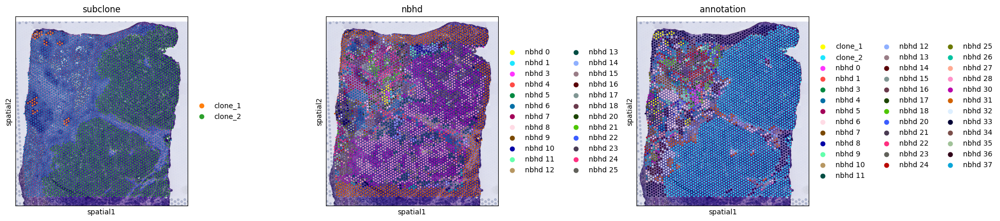

In [23]:
sc.pl.spatial(a, color=['subclone', 'nbhd', 'annotation'])

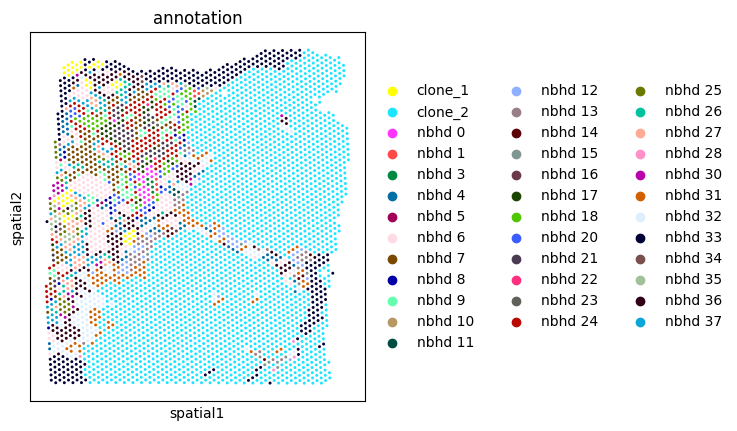

In [24]:
sc.pl.spatial(a, color=['annotation'], alpha_img=0)

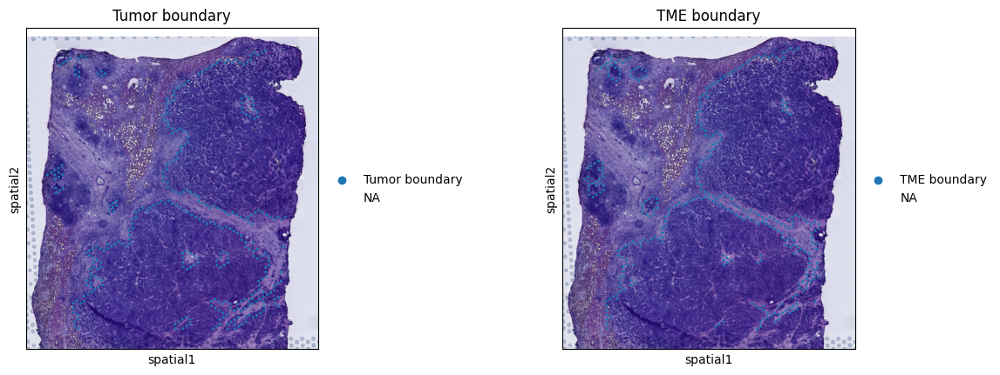

In [25]:
sc.pl.spatial(a, color=['Tumor boundary', 'TME boundary'])

In [26]:
import anndata
combined = anndata.concat(sid_to_adata.values())
combined.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT268B1-U2_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.582792,HT268B1-U2,,nbhd 9,nbhd 9
HT268B1-U2_AAACACCAATAACTGC-1,1,59,19,3.0,418.0,3.0,418.0,3.0,418.0,1.0,...,NaN,1.0,Tumor,AAACACCAATAACTGC-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.892656,HT268B1-U2,clone_2,nbhd 31,clone_2
HT268B1-U2_AAACAGAGCGACTCCT-1,1,14,94,3.0,483.0,3.0,483.0,3.0,483.0,2.0,...,NaN,2.0,Tumor,AAACAGAGCGACTCCT-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.818513,HT268B1-U2,clone_2,nbhd 13,clone_2
HT268B1-U2_AAACAGCTTTCAGAAG-1,1,43,9,4.0,638.0,4.0,638.0,4.0,638.0,1.0,...,NaN,1.0,Tumor,AAACAGCTTTCAGAAG-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.840491,HT268B1-U2,clone_2,nbhd 31,clone_2
HT268B1-U2_AAACAGGGTCTATATT-1,1,47,13,6.0,1208.0,6.0,1208.0,6.0,1208.0,1.0,...,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.879628,HT268B1-U2,clone_2,nbhd 13,clone_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,NaN,2.0,Tumor,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,,nbhd 12,nbhd 12
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,NaN,1.0,Tumor,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,NaN,1.0,Tumor,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2,nbhd 31,clone_2


In [27]:
from collections import Counter
exclude = [nbhd for nbhd, val in Counter(combined.obs['nbhd']).items() if val <= 10]

counts = Counter([nbhd for clone, nbhd in zip(combined.obs['subclone'], combined.obs['nbhd']) if clone!=''])
total_counts = Counter(combined.obs['nbhd'])

for k, v in counts.items():
    frac = v / total_counts[k]
    print(k, frac)
    if frac > .5:
        exclude.append(k)
    

combined = combined[np.asarray([True if x not in exclude else False for x in combined.obs['nbhd']])]
combined

nbhd 31 0.8547544409613375
nbhd 13 0.7788533134772897
nbhd 33 0.546569741026806
nbhd 32 0.8311298076923077
nbhd 36 0.5518955873213176
nbhd 6 0.17059483726150393
nbhd 1 0.4523809523809524
nbhd 16 0.7125
nbhd 12 0.7385057471264368
nbhd 25 0.09259259259259259
nbhd 4 0.4377224199288256
nbhd 14 0.870253164556962
nbhd 11 0.6567164179104478
nbhd 35 0.4959349593495935
nbhd 3 0.20270270270270271
nbhd 27 0.06818181818181818
nbhd 15 0.7869822485207101
nbhd 30 0.651685393258427
nbhd 18 0.09646302250803858
nbhd 37 0.10989010989010989
nbhd 5 0.08064516129032258
nbhd 17 0.03088803088803089
nbhd 28 0.65
nbhd 20 0.06529209621993128
nbhd 26 0.048484848484848485
nbhd 21 0.017543859649122806
nbhd 34 0.25
nbhd 9 0.005571030640668524
nbhd 10 0.9245283018867925
nbhd 24 0.007594936708860759
nbhd 0 0.021505376344086023
nbhd 8 0.025


View of AnnData object with n_obs × n_vars = 4942 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial', 'spatial_original'

In [50]:
exclude

['nbhd 29',
 'nbhd 22',
 'nbhd 23',
 'nbhd 2',
 'nbhd 31',
 'nbhd 13',
 'nbhd 33',
 'nbhd 32',
 'nbhd 36',
 'nbhd 16',
 'nbhd 12',
 'nbhd 14',
 'nbhd 11',
 'nbhd 15',
 'nbhd 30',
 'nbhd 28',
 'nbhd 10']

In [29]:
boundary = combined[pd.isnull(combined.obs[['TME boundary', 'Tumor boundary']]).sum(1) < 2]
boundary

View of AnnData object with n_obs × n_vars = 752 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial', 'spatial_original'

In [30]:
from collections import Counter

clone_to_counts = {}
data = []
order = [k for k in sorted(set(combined.obs['nbhd'])) if k not in exclude]
cs = Counter(boundary.obs['nbhd'])
d = {k:cs[k] / boundary.shape[0] for k in order}
contact_df = pd.DataFrame(data=[[k, v] for k, v in d.items()], columns=['nbhd', 'fraction'])
contact_df.sort_values('fraction', ascending=False)

,nbhd,fraction
14,nbhd 4,0.323138
16,nbhd 6,0.304521
3,nbhd 18,0.047872
13,nbhd 37,0.043883
9,nbhd 27,0.039894
12,nbhd 35,0.035904
8,nbhd 26,0.029255
4,nbhd 20,0.027926
7,nbhd 25,0.027926
1,nbhd 1,0.023936


In [31]:
import altair as alt
nbhd_order = contact_df.sort_values('fraction', ascending=False)['nbhd'].to_list()
alt.Chart(contact_df).mark_bar().encode(
    y='fraction',
#     y=alt.Y('nbhd', sort=nbhd_order),
    color=alt.Color('nbhd', sort='-y').scale(scheme="category20"),
    order=alt.Order('fraction', sort='ascending')
)

alt.Chart(...)

In [32]:
combined.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT268B1-U2_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.582792,HT268B1-U2,,nbhd 9,nbhd 9
HT268B1-U2_AAACAGTGTTCCTGGG-1,1,73,43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGTGTTCCTGGG-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.658580,HT268B1-U2,,nbhd 17,nbhd 17
HT268B1-U2_AAACATTTCCCGGATT-1,1,61,97,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACATTTCCCGGATT-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.522610,HT268B1-U2,,nbhd 20,nbhd 20
HT268B1-U2_AAACCCGAACGAAATC-1,1,45,115,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACCCGAACGAAATC-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.578203,HT268B1-U2,,nbhd 26,nbhd 26
HT268B1-U2_AAACCGGAAATGTTAA-1,1,54,124,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACCGGAAATGTTAA-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.651563,HT268B1-U2,,nbhd 25,nbhd 25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTGCAGCCACGTCA-1,1,60,74,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTGCAGCCACGTCA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.692129,HT268B1-U32,,nbhd 7,nbhd 7
HT268B1-U32_TTGTGGTGGTACTAAG-1,1,63,95,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTGGTGGTACTAAG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.650773,HT268B1-U32,,nbhd 7,nbhd 7
HT268B1-U32_TTGTGTTTCCCGAAAG-1,1,51,59,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTGTTTCCCGAAAG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.683305,HT268B1-U32,,nbhd 4,nbhd 4
HT268B1-U32_TTGTTGGCAATGACTG-1,1,76,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTGGCAATGACTG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.762991,HT268B1-U32,,nbhd 37,nbhd 37


In [33]:
cmap = sns.color_palette('tab20') + sns.color_palette('tab20b')
mapping = {
    4: (98, 94, 196),
    6: (60, 185, 199),
    7: (63, 191, 112),
    8: (160, 189, 57),
}
cmap = {i:x if i not in mapping else np.asarray(mapping[i]) / 255.
        for i, x in enumerate(cmap)}



In [34]:

f = anndata.concat(sid_to_adata.values())


counts = Counter(f.obs['nbhd'])
f = f[np.asarray([True if counts[x] > 10 else False for x in f.obs['nbhd']])]

# get rid or ribosomal
f = f[:, [g for g in f.var.index.to_list() if g[:2] != 'RP']]

sc.pp.filter_genes(f, min_cells=10)

sc.pp.log1p(f)
sc.pp.scale(f)
sc.tl.rank_genes_groups(f, groupby='nbhd')

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/preprocessing/_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


... storing 'barcode' as categorical
... storing 'nbhd' as categorical
... storing 'annotation' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/li

In [35]:
for nbhd in sorted(set(f.obs['nbhd'])):
    print(nbhd, f.uns['rank_genes_groups']['names'][nbhd][:10])

nbhd 0 ['HP' 'APOA2' 'IGFBP7' 'APOA1' 'APOC1' 'APOC3' 'FGA' 'C3' 'APOC2' 'APOE']
nbhd 1 ['TMA7' 'GNAS' 'ACTG1' 'TMSB10' 'EEF1A1' 'ATP5F1E' 'B2M' 'TUBA1B' 'MYL6'
 'TIMP1']
nbhd 10 ['SNRPD1' 'H2AFZ' 'MRPL51' 'YBX3' 'FABP5' 'HNRNPA2B1' 'BCL2A1' 'ATP5F1A'
 'PRAME' 'FSCN1']
nbhd 11 ['PKM' 'GAPDH' 'TUBB' 'TXNL4A' 'EIF4A1' 'GSTP1' 'TUBA1B' 'FUS' 'MRPS21'
 'HSP90AB1']
nbhd 12 ['MRPL51' 'YBX3' 'S100A14' 'SNHG7' 'GSTP1' 'MARCO' 'H2AFZ' 'CD9' 'CD24'
 'PRDX2']
nbhd 13 ['YBX3' 'MRPL51' 'GSTP1' 'S100A14' 'CD24' 'ATP5F1A' 'H2AFZ' 'PRDX2'
 'MARCO' 'SNHG29']
nbhd 14 ['GSTP1' 'MRPL51' 'YBX3' 'H2AFZ' 'CD24' 'NARS' 'EEF1G' 'SNHG29' 'EEF2'
 'ATP5F1A']
nbhd 15 ['YBX3' 'CD9' 'SNHG29' 'CD24' 'GSTP1' 'MT-CO2' 'MRPL51' 'ATP5F1A'
 'S100A14' 'MARCO']
nbhd 16 ['GSTP1' 'TIMM13' 'ATP5F1A' 'H2AFZ' 'MARCO' 'PTMA' 'NME2' 'FSCN1' 'FABP5'
 'YBX3']
nbhd 17 ['HP' 'APOC1' 'APOC3' 'APOC2' 'SERPINA1' 'ALB' 'AMBP' 'APOA1' 'APOA2'
 'IGFBP7']
nbhd 18 ['TIMP1' 'IGFBP7' 'TMSB4X' 'APOC1' 'HP' 'APOC3' 'CST3' 'APOE' 'APOC2'
 'SERPINA

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


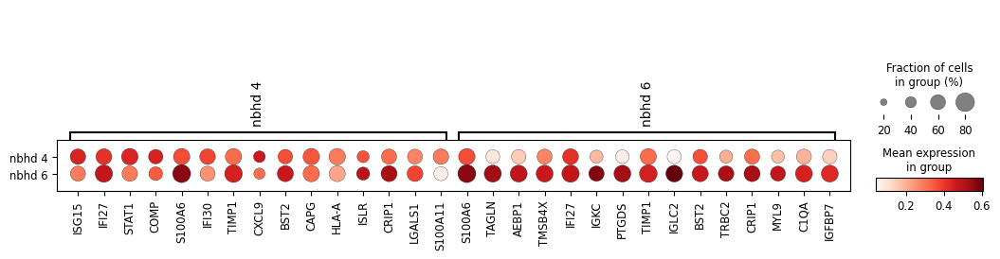

In [36]:
nbhds = [f'nbhd {x}' for x in [4,6]]
z = f[np.asarray([True if x in nbhds else False for x in f.obs['nbhd']])]

sc.pl.rank_genes_groups_dotplot(z, groupby='nbhd', n_genes=15, groups=nbhds,)


In [37]:
f.uns['rank_genes_groups']['names']['nbhd 4'][:10]

array(['ISG15', 'IFI27', 'STAT1', 'COMP', 'S100A6', 'IFI30', 'TIMP1',
       'CXCL9', 'BST2', 'CAPG'], dtype=object)

In [38]:
f.uns['rank_genes_groups'].keys()

dict_keys(['params', 'names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges'])

In [39]:
n = 50
nbhd4 = f.uns['rank_genes_groups']['names']['nbhd 4'][:n]
nbhd6 = f.uns['rank_genes_groups']['names']['nbhd 6'][:n]

common = set(nbhd4).intersection(nbhd6)
common

{'BST2',
 'CRIP1',
 'HLA-DQB1',
 'HLA-DRA',
 'HLA-DRB1',
 'IFI27',
 'ISLR',
 'LAPTM5',
 'LGALS1',
 'S100A6',
 'SPARC',
 'TIMP1',
 'TMSB4X'}

In [40]:
exp_df = pd.DataFrame(f.X, columns=f.var.index.to_list(), index=f.obs.index.to_list())
exp_df['nbhd'] = f.obs['nbhd']
exp_df = exp_df.groupby('nbhd').mean()
exp_df

,AL627309.1,AL627309.5,LINC01409,LINC01128,LINC00115,FAM41C,AL645608.6,LINC02593,SAMD11,NOC2L,...,MT-CYB,BX004987.1,AC145212.1,MAFIP,AC011043.1,AL354822.1,AL592183.1,AC240274.1,AC007325.4,AC007325.2
nbhd,,,,,,,,,,,,,,,,,,,,,
nbhd 0,0.162447,-0.077285,0.041961,0.143781,0.020492,-0.089175,-0.044897,0.339097,1.237270,-0.005948,...,0.823243,-0.058004,-0.037913,0.068045,0.164780,-0.095157,-0.162346,0.111486,-0.025379,0.013448
nbhd 1,0.185180,0.074902,-0.030544,-0.045192,-0.029266,-0.089175,-0.044897,0.040203,0.223734,0.253194,...,0.593018,0.465852,0.116194,0.011550,0.230668,0.281251,-0.090881,-0.060859,0.028006,0.029810
nbhd 3,-0.049720,-0.077285,0.171027,0.167195,0.069272,0.061492,0.256679,0.460728,0.678560,-0.003157,...,0.893640,-0.058004,0.017406,0.123429,0.251534,0.189692,-0.000100,-0.060859,0.251917,0.052658
nbhd 4,0.020499,0.013703,-0.059267,-0.035688,0.050578,0.089374,-0.005188,-0.056231,-0.091410,0.064809,...,-0.076638,0.002576,-0.018484,0.049673,-0.058560,0.017363,0.004127,0.069903,-0.002919,-0.030789
nbhd 5,0.268531,-0.077285,-0.096457,0.009009,0.020492,-0.089175,-0.044897,0.102237,-0.120908,-0.069087,...,-0.104178,-0.058004,-0.056663,0.068045,0.006527,0.074833,-0.162346,-0.060859,-0.096333,-0.139262
nbhd 6,0.016716,-0.025849,-0.075951,-0.018254,-0.050512,-0.014095,-0.044897,0.067980,0.106743,-0.225493,...,-0.386345,-0.038899,-0.095920,-0.042593,-0.048810,-0.047842,-0.077555,0.011096,0.005909,-0.059565
nbhd 7,-0.001239,-0.045875,-0.171618,-0.090478,-0.097139,-0.061781,-0.044897,0.200667,0.456096,-0.379828,...,-0.326942,-0.058004,-0.135779,-0.016224,-0.070068,-0.095157,-0.118098,0.017903,-0.040911,-0.121815
nbhd 8,-0.049720,-0.077285,-0.127602,-0.062418,0.124983,-0.089175,-0.044897,-0.134622,0.217592,-0.126562,...,-0.035165,-0.058004,-0.047047,-0.147662,-0.193955,-0.095157,-0.162346,0.339843,-0.226711,-0.139262
nbhd 9,0.005243,-0.006066,-0.151208,-0.043916,-0.054655,-0.089175,-0.044897,0.131268,0.489675,-0.362011,...,-0.243363,-0.010586,-0.107787,-0.091782,-0.061533,-0.095157,-0.095459,0.028434,0.027036,-0.139262


In [41]:
pool = sorted(set(nbhd4.tolist() + nbhd6.tolist()))
deltas = [[g, exp_df.loc['nbhd 4', g] - exp_df.loc['nbhd 6', g]] for g in pool]
deltas = pd.DataFrame(data=deltas, columns=['gene', 'delta']).set_index('gene')
deltas

,delta
gene,
AEBP1,-0.337787
ATP6V0B,0.260880
BST2,-0.103566
C11orf96,-0.453672
C15orf48,0.260906
...,...
TRBC2,-0.320752
TYMP,0.343582
TYROBP,-0.142724


In [42]:
k = 10
top_common = deltas.loc[list(common)].abs().sort_values('delta').index.to_list()[:k]

specific = deltas[[True if x not in common else False for x in deltas.index.to_list()]]

top_nbhd4 = specific.sort_values('delta', ascending=False).index.to_list()[:k]
top_nbhd6 = specific.sort_values('delta', ascending=True).index.to_list()[:k]
top_common, top_nbhd4, top_nbhd6

(['IFI27',
  'LAPTM5',
  'HLA-DRA',
  'LGALS1',
  'BST2',
  'HLA-DQB1',
  'TIMP1',
  'HLA-DRB1',
  'ISLR',
  'SPARC'],
 ['HMGA1',
  'TYMP',
  'SSR4',
  'TPM3',
  'SMIM22',
  'RSAD2',
  'C15orf48',
  'ATP6V0B',
  'LGALS9',
  'S100A11'],
 ['IGLC2',
  'PTGDS',
  'CCL19',
  'TAGLN',
  'C11orf96',
  'IGHG1',
  'IGKC',
  'LUM',
  'COL6A2',
  'C1R'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


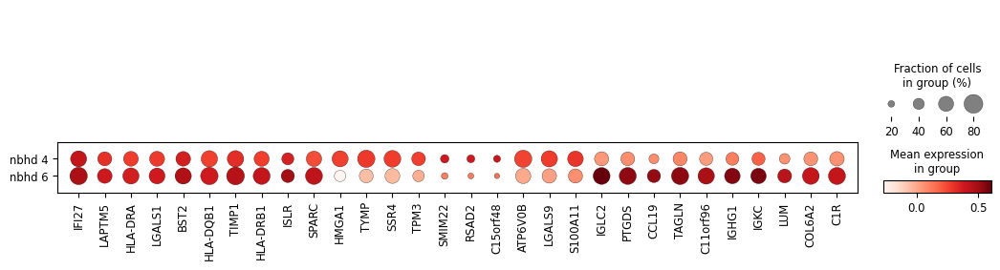

In [43]:
genes = top_common + top_nbhd4 + top_nbhd6
source = f[np.asarray([True if x in ['nbhd 4', 'nbhd 6'] else False for x in f.obs['nbhd']])]
sc.pl.dotplot(source, var_names=genes, groupby='nbhd', show=False)
plt.savefig('/data/estorrs/sandbox/subclone_dots.svg')

In [44]:
a = sid_to_adata[('HT268B1-U12', 'visium')].copy()
a.obs[a.obs['subclone']==''] = np.nan

... storing 'barcode' as categorical
... storing 'nbhd' as categorical
... storing 'annotation' as categorical


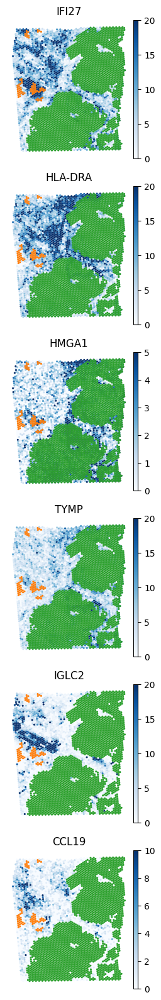

In [45]:
sc.settings._vector_friendly = True
mapping = {
    'IFI27': 20,
    'HLA-DRA': 20,
    'HMGA1': 5,
    'TYMP': 20,
    'IGLC2': 20,
    'CCL19': 10,
    
}

fig, axs = plt.subplots(nrows=len(mapping), figsize=(4, 20))
for i, (gene, vmax) in enumerate(mapping.items()):
    ax = axs[i]
    sc.pl.spatial(a, color=gene, ncols=2, alpha_img=0, size=1.5, vmax=vmax, cmap='Blues', ax=ax, return_fig=False, show=False)
    sc.pl.spatial(a, color='subclone', alpha_img=0, size=1.5, ax=ax, return_fig=False, show=False, legend_loc=None)
    ax.set_title(gene)
    ax.invert_yaxis()
    ax.axis('off')
plt.savefig('/data/estorrs/sandbox/subclone_ht268_exp.svg', dpi=300)

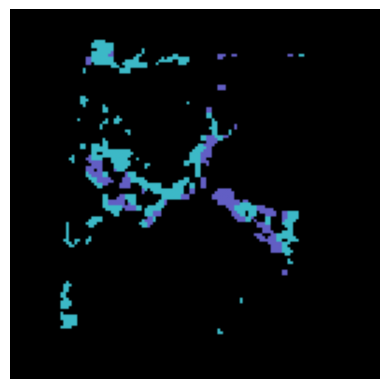

In [49]:

rgb = get_nbhd_rgb(volume[12], [4,6], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')
plt.show()

In [75]:

total = anndata.concat(sid_to_adata.values())

tumor_nbhds = []

counts = Counter([nbhd for clone, nbhd in zip(total.obs['subclone'], total.obs['nbhd']) if clone!=''])
total_counts = Counter(total.obs['nbhd'])

for k, v in counts.items():
    frac = v / total_counts[k]
    print(k, frac)
    if frac > .6:
        tumor_nbhds.append(k)
    

tumor = total[np.asarray([True if x not in tumor_nbhds else False for x in total.obs['nbhd']])]
tumor

nbhd 31 0.8547544409613375
nbhd 13 0.7788533134772897
nbhd 33 0.546569741026806
nbhd 32 0.8311298076923077
nbhd 36 0.5518955873213176
nbhd 6 0.17059483726150393
nbhd 1 0.4523809523809524
nbhd 16 0.7125
nbhd 12 0.7385057471264368
nbhd 25 0.09259259259259259
nbhd 4 0.4377224199288256
nbhd 14 0.870253164556962
nbhd 11 0.6567164179104478
nbhd 35 0.4959349593495935
nbhd 3 0.20270270270270271
nbhd 27 0.06818181818181818
nbhd 15 0.7869822485207101
nbhd 30 0.651685393258427
nbhd 18 0.09646302250803858
nbhd 37 0.10989010989010989
nbhd 5 0.08064516129032258
nbhd 17 0.03088803088803089
nbhd 28 0.65
nbhd 20 0.06529209621993128
nbhd 26 0.048484848484848485
nbhd 21 0.017543859649122806
nbhd 34 0.25
nbhd 9 0.005571030640668524
nbhd 10 0.9245283018867925
nbhd 24 0.007594936708860759
nbhd 0 0.021505376344086023
nbhd 8 0.025


View of AnnData object with n_obs × n_vars = 8771 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial', 'spatial_original'

In [76]:
tumor_nbhds

['nbhd 31',
 'nbhd 13',
 'nbhd 32',
 'nbhd 16',
 'nbhd 12',
 'nbhd 14',
 'nbhd 11',
 'nbhd 15',
 'nbhd 30',
 'nbhd 28',
 'nbhd 10']

In [101]:
volume.shape

(32, 132, 132)

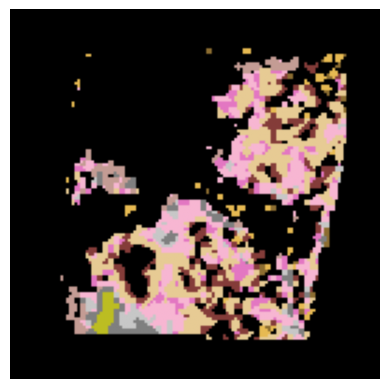

In [116]:

rgb = get_nbhd_rgb(volume[1], [int(x.split(' ')[-1]) for x in tumor_nbhds], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')
plt.show()

In [ ]:
mushroom = Mushroom.from_config(
    os.path.join('/data/estorrs/mushroom/data/projects/subclone', case, f'mushroom_50res')
)

In [80]:
fps = sorted(utils.listfiles(os.path.join('/data/estorrs/mushroom/data/projects/submission_v1/', case),
                             regex=r'cytospace_.*/outputs/cell_type_assignments_by_spot.csv$'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/cytospace_visium_section0/outputs/cell_type_assignments_by_spot.csv',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/cytospace_visium_section1/outputs/cell_type_assignments_by_spot.csv',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/cytospace_visium_section2/outputs/cell_type_assignments_by_spot.csv',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/cytospace_visium_section3/outputs/cell_type_assignments_by_spot.csv']

In [81]:
df = pd.read_csv(fps[0], sep=',', index_col=0)
df

,Tumor,Mast,LumSec,Fibroblast,Endothelial,Plasma,LumHR,pDC,T,Macrophage,Adipocyte,Basal,B,Pericyte,Total cells
SpotID,,,,,,,,,,,,,,,
h62_w20,12,0,2,1,0,1,4,0,0,0,0,0,0,0,20
h39_w105,12,0,1,0,1,0,4,0,0,0,0,0,0,0,18
h89_w92,4,2,0,0,0,0,6,3,0,4,0,1,0,0,20
h63_w89,12,0,8,0,0,1,2,0,0,0,0,0,0,0,23
h94_w105,14,0,1,0,0,4,1,0,0,0,0,0,0,0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
h36_w18,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
h116_w109,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
h120_w68,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [82]:
cell_type_mapping = {
    'LumHR': 'Epithelial',
    'Tumor': 'Epithelial',
    'LumSec': 'Epithelial',
    'Basal': 'Epithelial',
    'Ductal': 'Epithelial',
    'Basal_Epithelium': 'Epithelial',
    'Luminal_Epithelium': 'Epithelial',
    'Luminal_Tumor': 'Epithelial',
    'Myeloid': 'Macrophage',
    'Smooth_Muscle_Cells_Fibroblast_Mix': 'Fibroblast',
    'T_NK': 'T_cell',
    'T': 'T_cell',
    'B': 'B_cell',
    'Islet_alpha': 'Islet',
    'Islet_beta': 'Islet',
    'Islet_delta': 'Islet',
    'Islet_gamma': 'Islet',
}
excluded_cell_types = [
    'Doublet',
    'Remove_Unknown',
    'Plasma',
    'Schwann',
#     'Club_Cells',
#     'Hillock_Cells'
]

In [83]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1/'

In [84]:

#     outputs = pickle.load(open(os.path.join(project_dir, case, 'mushroom_50res', 'outputs.pkl'), 'rb'))
outputs = pickle.load(open(os.path.join('/data/estorrs/mushroom/data/projects/subclone', case, 'mushroom_50res', 'outputs.pkl'), 'rb'))
sids = outputs['section_ids']
size = next(iter(outputs['dtype_to_clusters'].values()))[0].shape[1:]

sid_to_cytospace = {}
dtype_to_count = {dt:0 for dt in set([x for _, x in sids])}
channels = []
for sid, dtype in sids:
    if dtype in ['visium', 'xenium']:
        count = dtype_to_count[dtype]
        fp = os.path.join(project_dir, case, f'cytospace_{dtype}_section{count}', 'outputs', 'cell_type_assignments_by_spot.csv')
        df = pd.read_csv(fp, sep=',', index_col=0)
        df = df.iloc[:, :-1] # dont need total cells

        df = df[[c for c in df.columns if c not in excluded_cell_types]]
        renamed = [cell_type_mapping.get(c, c) for c in df.columns]
        count_dict = {}
        for ct in sorted(set(renamed)):
            idxs = [i for i, x in enumerate(renamed) if x == ct]
            count_dict[ct] = df.values[:, idxs].sum(1)
        merged = pd.DataFrame.from_dict(count_dict)
        merged.index = df.index.to_list()
        merged.columns = sorted(set(renamed))

        tiled = np.zeros((size[0], size[1], merged.shape[1]), dtype=int)
        for i, spotid in enumerate(merged.index.to_list()):
            h = int(re.sub(r'^h([0-9]+).*$', r'\1', spotid))
            w = int(re.sub(r'^.*w([0-9]+)$', r'\1', spotid))
            tiled[h, w] = merged.values[i]

        sid_to_cytospace[(sid, dtype)] = tiled
        channels = list(merged.columns)

        dtype_to_count[dtype] += 1


In [85]:
channels

['Adipocyte',
 'B_cell',
 'Endothelial',
 'Epithelial',
 'Fibroblast',
 'Macrophage',
 'Mast',
 'Pericyte',
 'T_cell',
 'pDC']

In [86]:
sid_to_cytospace.keys()

dict_keys([('HT268B1-U2', 'visium'), ('HT268B1-U12', 'visium'), ('HT268B1-U22', 'visium'), ('HT268B1-U32', 'visium')])

In [88]:
sid_to_cytospace[('HT268B1-U2', 'visium')].shape

(132, 132, 10)

In [89]:
def show_cytospace(sid_to_cytospace, channels, show_channels=None):
    if show_channels is None:
        show_channels = channels

    nrows, ncols = len(sid_to_cytospace), len(show_channels)
    fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols, nrows))
    if nrows == 1:
        axs = rearrange(axs, 'c -> 1 c')
    if ncols == 1:
        axs = rearrange(axs, 'c -> c 1')

    for i, ((sid, dtype), tiled) in enumerate(sid_to_cytospace.items()):
        for j, channel in enumerate(show_channels):
            ax = axs[i, j]
            img = tiled[..., channels.index(channel)]
            ax.imshow(img)
            if i==0: ax.set_title(channel)
            if j==0: ax.set_ylabel(dtype)
            ax.set_xticks([])
            ax.set_yticks([])

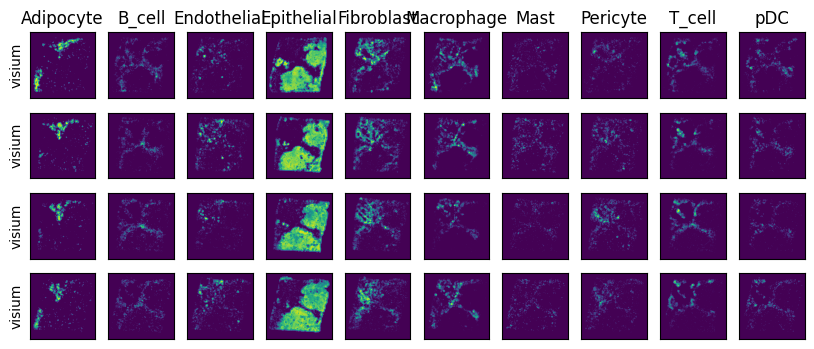

In [90]:
show_cytospace(sid_to_cytospace, channels)

In [95]:
spore = mushroom.dtype_to_spore['visium']

genes = ['IFI27', 'HLA-DRA', 'HMGA1', 'TYMP', 'IGLC2', 'CCL19']
idxs = [spore.dtype_to_channels['visium'].index(x) for x in genes]
exp_volume = np.stack([x[..., idxs] for x in spore.true_pixels])
exp_volume.shape

(4, 132, 132, 6)

In [98]:
order, positions = zip(*[(sid, pos)
                         for (sid, dtype), pos in zip(mushroom.section_ids, mushroom.section_positions)
                         if (sid, dtype) in spore.section_ids])
order, positions

(('HT268B1-U2', 'HT268B1-U12', 'HT268B1-U22', 'HT268B1-U32'), (1, 11, 21, 31))

In [99]:
v = exp_volume.copy()
v = rearrange(v, 'n h w c -> c n h w')
v.shape

(6, 4, 132, 132)

In [100]:
positions = [0, *positions, mushroom.section_positions[-1]]
positions

[0, 1, 11, 21, 31, 31]

In [102]:

v = np.concatenate((
    v[:, :1],
    v,
#     v[:, -1:],
), axis=1)
interpolated = utils.get_interpolated_volume(v, positions, method='linear')
interpolated.shape

(6, 32, 132, 132)

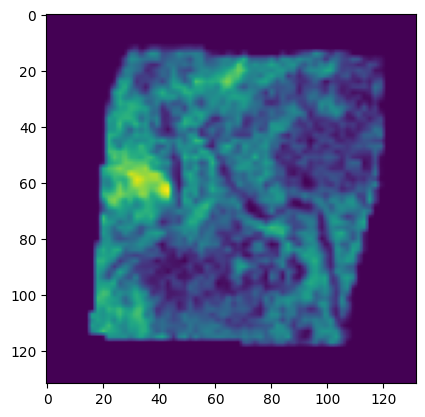

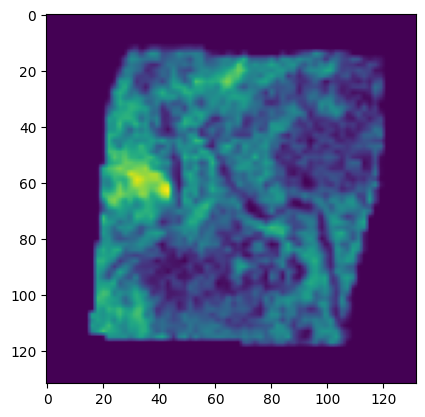

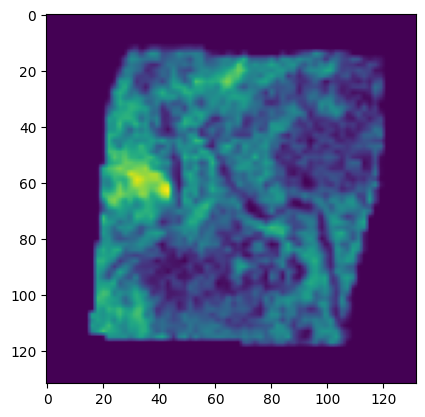

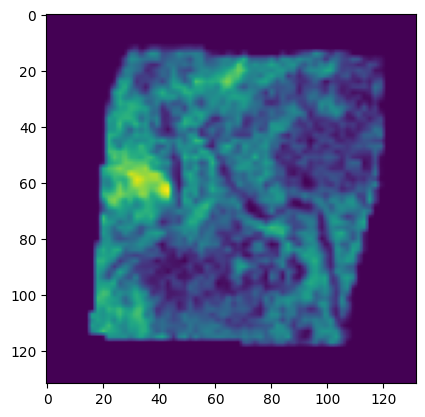

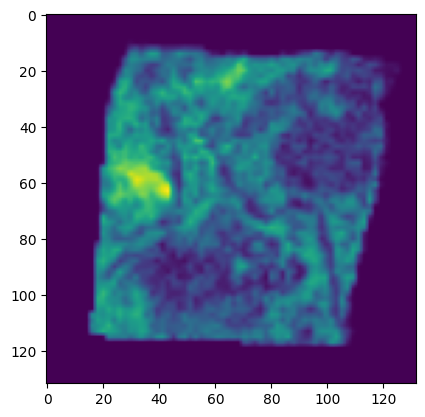

...

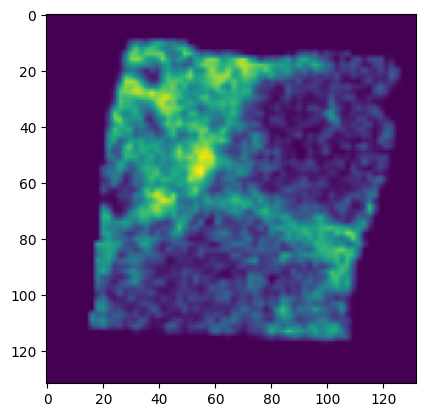

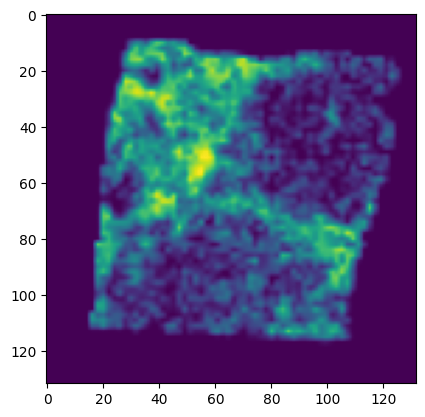

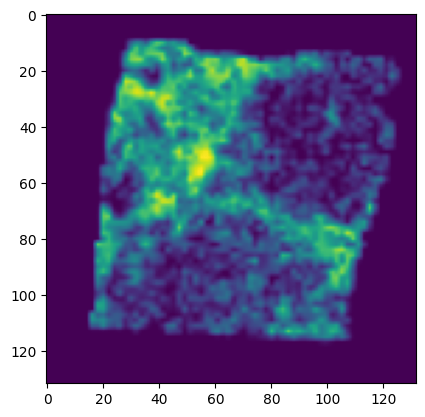

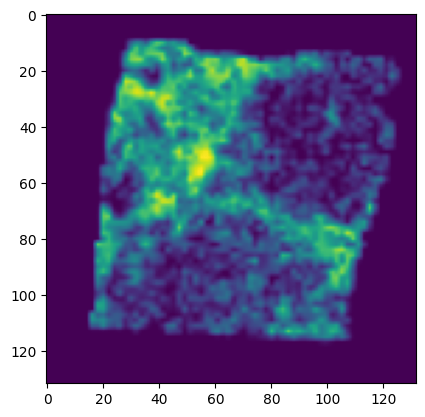

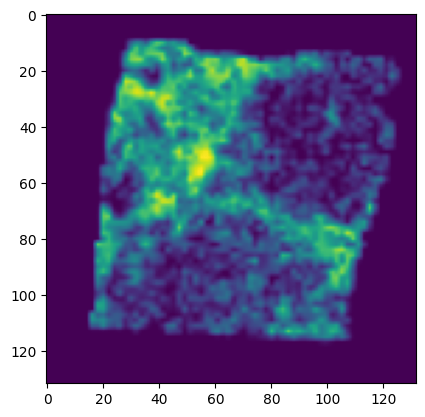

In [103]:
for x in rearrange(interpolated, 'c n h w -> n h w c'):
    plt.imshow(x[..., 0])
    plt.show()

In [104]:
out_dir = '/data/estorrs/mushroom/data/projects/subclone/HT268B1/volume_viz'
Path(out_dir).mkdir(parents=True, exist_ok=True)


In [113]:
x.shape

(4, 132, 132, 10)

In [119]:
tifffile.imwrite(os.path.join(out_dir, 'exp_volume.tif'), interpolated[:, 1:])

In [114]:
# x = np.stack([sid_to_cytospace[sid] for sid in spore.section_ids])
# tifffile.imwrite(os.path.join(out_dir, 'cytospace_volume.tif'), x)

In [118]:
tifffile.imwrite(os.path.join(out_dir, 'nbhd_volume.tif'), volume[1:])

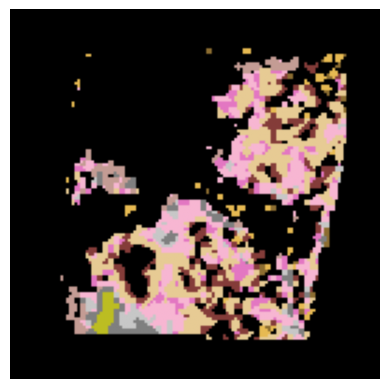

In [117]:

rgb = get_nbhd_rgb(volume[1], [int(x.split(' ')[-1]) for x in tumor_nbhds], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')
plt.show()